<a href="https://colab.research.google.com/github/JSEFERINO/MISALUMNOS20252/blob/main/2025_Corte3_2NUEVO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Resultados del Segundo Corte 202510 - Coordinación de Matemáticas y Estadística**
## **1. Nuestras librerias**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
!pip install bioinfokit &>/dev/null
from bioinfokit.analys import stat
from statsmodels.graphics.factorplots import interaction_plot

## **2. Importando una base de datos a Python**

In [ ]:
import pandas as pd

# Corrected URL of the CSV file
#url = 'https://raw.githubusercontent.com/JSEFERINO/MISPROFES2025/main/2025_DEF_SEM1.csv'
# Changed from 'https://github.com/JSEFERINO/MISPROFES2025/blob/main/DATOSCORTE2202510.csv'
#  to access the raw content of the file

# Load the CSV from the URL
#datos = pd.read_csv(url, delimiter=';') # Added delimiter

In [ ]:
datos = pd.read_csv("/content/2025_DEF_SEM1.csv", delimiter=';') # Added delimiter


In [ ]:
datos.tail()

,Id_estudiante,Apellidos_estudiante,Nombres_estudiante,Situacion_academica,Becas,Email,Telefono,Celular,Programa,Cod_prog,...,Cod_comp,Componente,Nota_parcial,Cod_subcomp,Subcomponente,Nota_parcial_subcomponente,Id_docente,Apellidos_docente,Nombres_docente,Nro_componentes
9874,T00091981,TOVAR DIAZ,YEISON ESTIVEN,NaN,NaN,stiventovardiaz27@gmail.com,3146261779,57-3146261779,INGENIERIA CIVIL,7,...,REP2,REPORTE_2,2.4,NaN,NaN,NaN,T00047939,OLIVERA BELTRAN,GIOVANNI,3
9875,T00091981,TOVAR DIAZ,YEISON ESTIVEN,NaN,NaN,stiventovardiaz27@gmail.com,3146261779,57-3146261779,INGENIERIA CIVIL,7,...,REP3,REPORTE_3,2.3,NaN,NaN,NaN,T00047939,OLIVERA BELTRAN,GIOVANNI,3
9876,T00091981,TOVAR DIAZ,YEISON ESTIVEN,NaN,NaN,stiventovardiaz27@gmail.com,3146261779,57-3146261779,INGENIERIA CIVIL,7,...,REP1,REPORTE_1,2.1,NaN,NaN,NaN,T00001541,BARRIOS HERNANDEZ,EDER ANTONIO,3
9877,T00091981,TOVAR DIAZ,YEISON ESTIVEN,NaN,NaN,stiventovardiaz27@gmail.com,3146261779,57-3146261779,INGENIERIA CIVIL,7,...,REP2,REPORTE_2,3.2,NaN,NaN,NaN,T00001541,BARRIOS HERNANDEZ,EDER ANTONIO,3
9878,T00091981,TOVAR DIAZ,YEISON ESTIVEN,NaN,NaN,stiventovardiaz27@gmail.com,3146261779,57-3146261779,INGENIERIA CIVIL,7,...,REP3,REPORTE_3,2.6,NaN,NaN,NaN,T00001541,BARRIOS HERNANDEZ,EDER ANTONIO,3


In [ ]:
datos.columns

Index(['Id_estudiante', 'Apellidos_estudiante', 'Nombres_estudiante',
       'Situacion_academica', 'Becas', 'Email', 'Telefono', 'Celular',
       'Programa', 'Cod_prog', 'Periodo', 'Cod_tipo', 'Tipo_estudiante', 'Nrc',
       'Materia', 'Curso', 'Parte_periodo', 'Asignatura', 'Creditos', 'Sesion',
       'Cod_estatus', 'Estatus', 'Cod_comp', 'Componente', 'Nota_parcial',
       'Cod_subcomp', 'Subcomponente', 'Nota_parcial_subcomponente',
       'Id_docente', 'Apellidos_docente', 'Nombres_docente',
       'Nro_componentes'],
      dtype='object')

# **3. Gráficos Generales - Diagrama de caja y Bigotes - Incluyendo el Promedio**

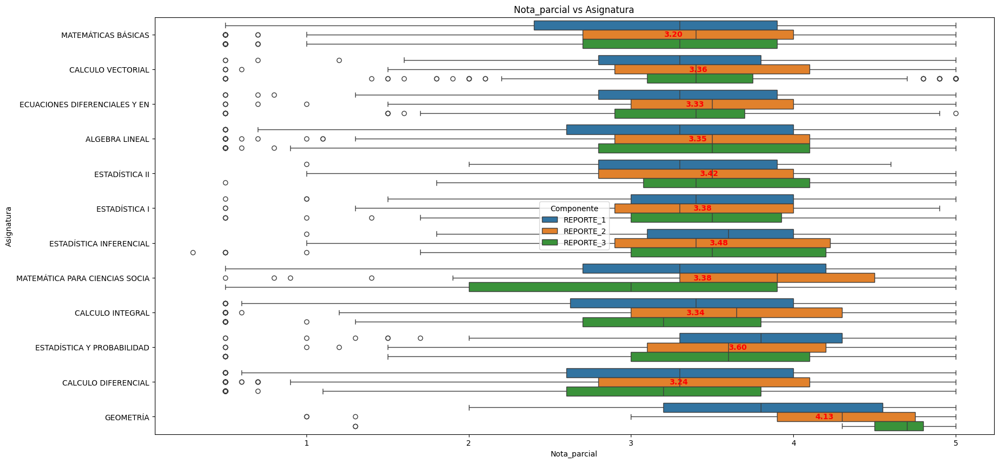

In [ ]:

# ## **4. Diagrama de caja y Bigotes**
fig, ax = plt.subplots(figsize=(20, 10)) # Changed from axs to ax
ax.set_title('Nota_parcial vs Asignatura') # Now using ax instead of axs[0]
sns.boxplot(y="Asignatura", x="Nota_parcial", hue='Componente', data=datos, ax=ax) # Now using ax instead of axs[0]
# Calculate the mean for each group
mean_by_group = datos.groupby('Asignatura')['Nota_parcial'].mean()

# Add the mean values to the plot
for i, asignatura in enumerate(datos['Asignatura'].unique()):
  mean_value = mean_by_group[asignatura]
  ax.text(mean_value, i, f'{mean_value:.2f}', ha='left', va='center', color='red', fontweight='bold')

#sns.swarmplot(y="Asignatura", x="Nota_parcial", data=datos, color='black', ax=ax); # Now using ax instead of axs[0]


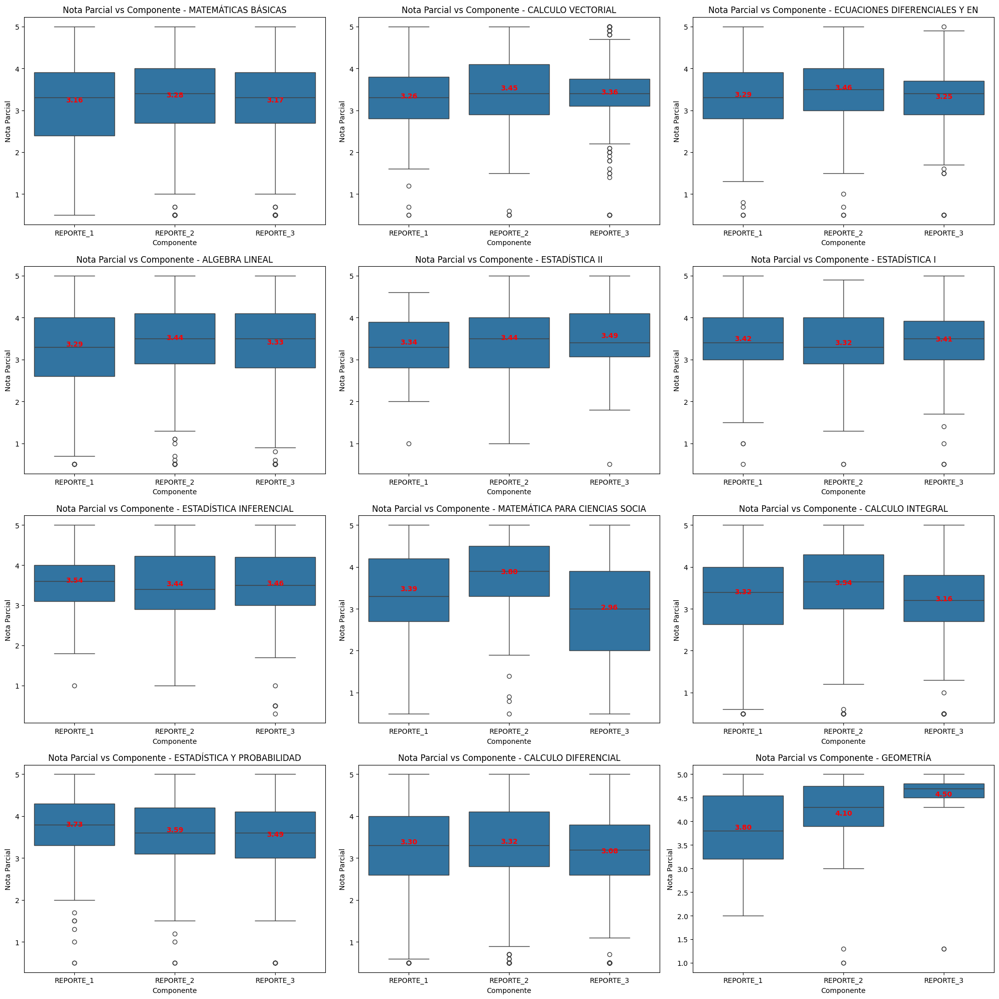

In [ ]:
# prompt: En el codigo anterior me puedes divir el grafico en tres grupos de Asignatura y  aparezca el promedio por cada Nota_parcial vs Asignatura DENTRO DE LA CAJA

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from bioinfokit.analys import stat
from statsmodels.graphics.factorplots import interaction_plot

# Load the CSV from the URL
datos = pd.read_csv("/content/2025_DEF_SEM1.csv", delimiter=';')

# Group the data by 'Asignatura'
asignaturas = datos['Asignatura'].unique()
n_asignaturas = len(asignaturas)
n_cols = 3  # Number of columns in the subplot grid

# Calculate the number of rows needed
n_rows = (n_asignaturas + n_cols - 1) // n_cols

# Create the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
axes = axes.flatten()  # Flatten the axes array

for i, asignatura in enumerate(asignaturas):
    ax = axes[i]
    subset = datos[datos['Asignatura'] == asignatura]

    sns.boxplot(y="Nota_parcial", x="Componente", data=subset, ax=ax)

    mean_by_componente = subset.groupby('Componente')['Nota_parcial'].mean()

    for j, componente in enumerate(subset['Componente'].unique()):
        mean_value = mean_by_componente[componente]
        ax.text(j, mean_value, f'{mean_value:.2f}', ha='center', va='bottom', color='red', fontweight='bold')

    ax.set_title(f'Nota Parcial vs Componente - {asignatura}')
    ax.set_xlabel('Componente')
    ax.set_ylabel('Nota Parcial')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


plt.tight_layout() # Adjust layout to prevent overlapping
plt.show()


# **4. Gráficos Generales Por Docentes - Diagrama de caja y Bigotes**


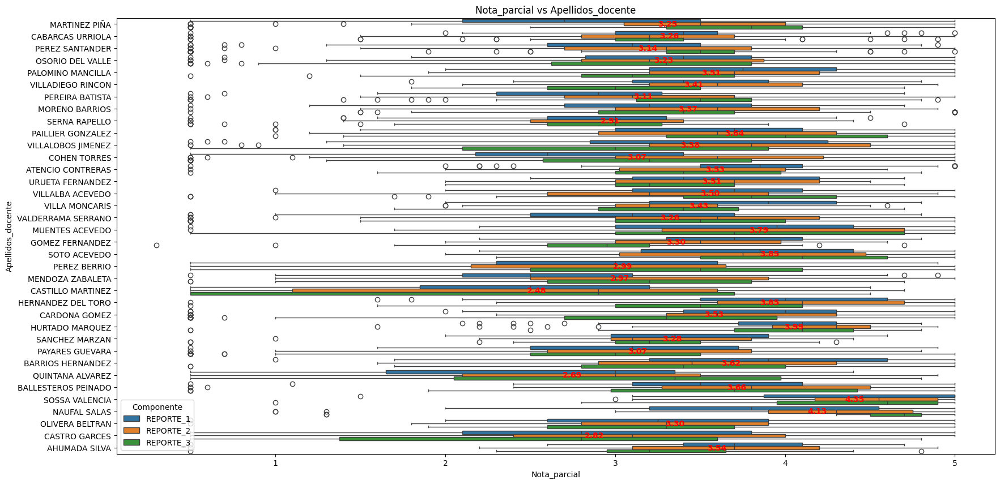

In [ ]:
# prompt: Agrega el promedio dentro del grafico

fig, ax = plt.subplots(figsize=(20, 10)) # Changed from axs to ax
ax.set_title('Nota_parcial vs Apellidos_docente') # Now using ax instead of axs[0]
sns.boxplot(y="Apellidos_docente", x="Nota_parcial", hue='Componente', data=datos, ax=ax) # Now using ax instead of axs[0]

# Calculate the mean for each group
mean_by_group = datos.groupby('Apellidos_docente')['Nota_parcial'].mean()

# Add the mean values to the plot
for i, docente in enumerate(datos['Apellidos_docente'].unique()):
  mean_value = mean_by_group[docente]
  ax.text(mean_value, i, f'{mean_value:.2f}', ha='left', va='center', color='red', fontweight='bold')

#sns.swarmplot(y="Asignatura", x="Nota_parcial", data=datos, color='black', ax=ax); # Now using ax instead of axs[0]


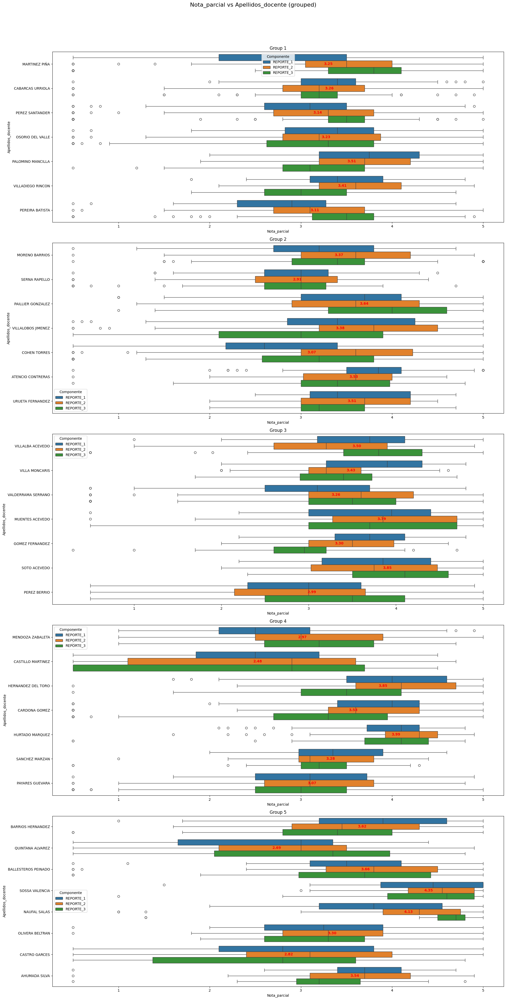

In [ ]:
# prompt: En el codigo anterior me puedes divir el grafico en tres grupos de Nombres_docente y  aparezca el promedio por cada REPORTE_1 y REPORTE_2

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'datos' DataFrame is already loaded as in the previous code

# Group docentes for the plot
num_groups = 5
docentes_per_group = len(datos['Apellidos_docente'].unique()) // num_groups
docente_groups = []
for i in range(num_groups):
    start_index = i * docentes_per_group
    end_index = (i + 1) * docentes_per_group if i < num_groups - 1 else len(datos['Apellidos_docente'].unique())
    docente_groups.append(datos['Apellidos_docente'].unique()[start_index:end_index])

fig, axes = plt.subplots(num_groups, 1, figsize=(20, 40))  # Adjust figure size as needed
fig.suptitle('Nota_parcial vs Apellidos_docente (grouped)', fontsize=16)

for i, group in enumerate(docente_groups):
    ax = axes[i]
    group_data = datos[datos['Apellidos_docente'].isin(group)]
    sns.boxplot(y="Apellidos_docente", x="Nota_parcial", hue='Componente', data=group_data, ax=ax)
    ax.set_title(f'Group {i+1}')

    mean_by_group = group_data.groupby('Apellidos_docente')['Nota_parcial'].mean()
    for j, docente in enumerate(group):
        mean_value = mean_by_group.get(docente, 0)  # Handle missing docentes
        ax.text(mean_value, j, f'{mean_value:.2f}', ha='left', va='center', color='red', fontweight='bold')

plt.tight_layout(rect=[0, 0, 1, 0.95]) # Adjust layout to prevent overlapping
plt.show()


## **5. Gráficos Generales Por Docentes - Diagrama de caja y Bigotes - Incluyendo el Promedio**

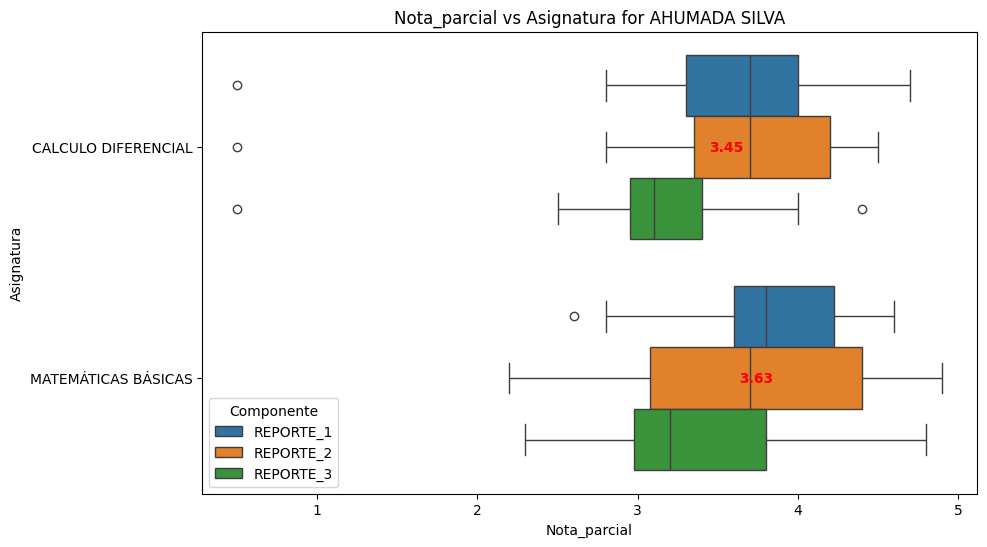

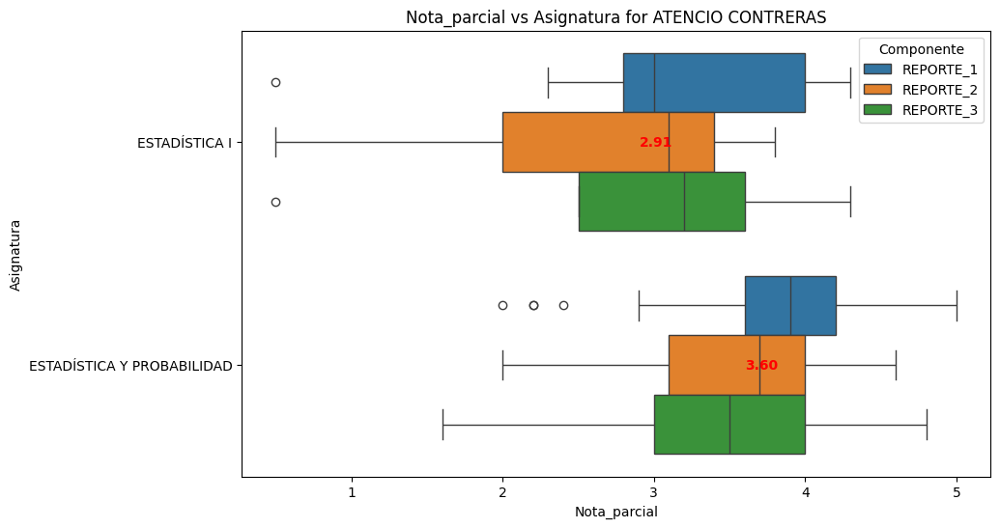

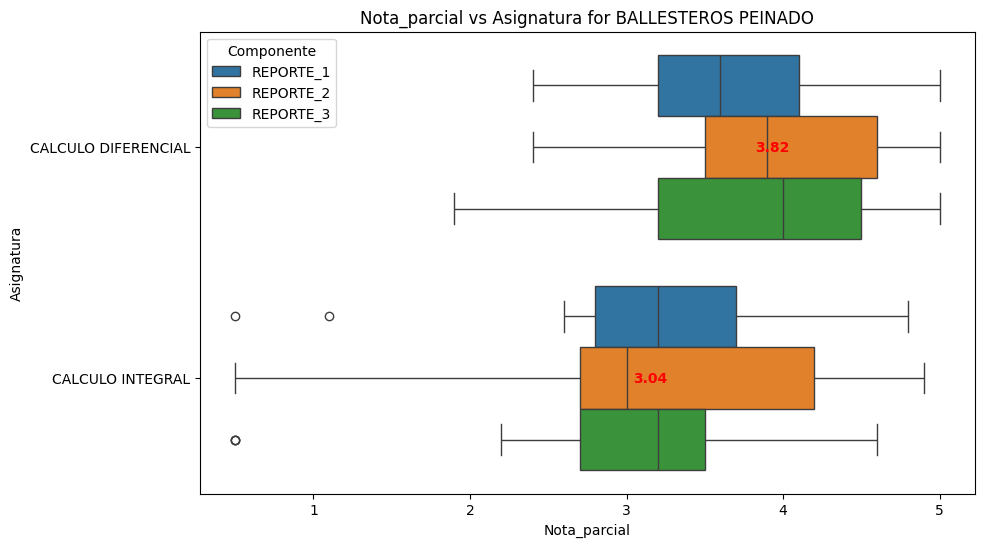

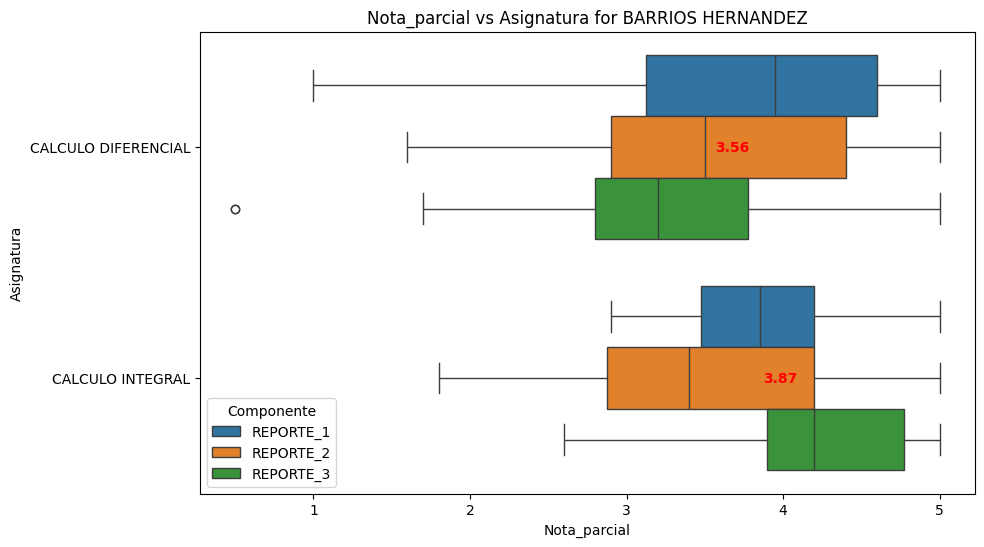

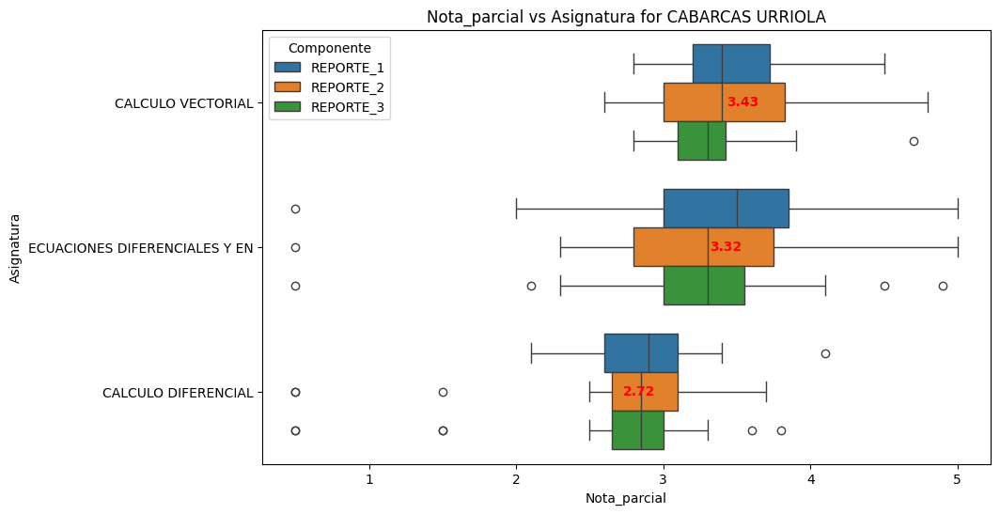

...

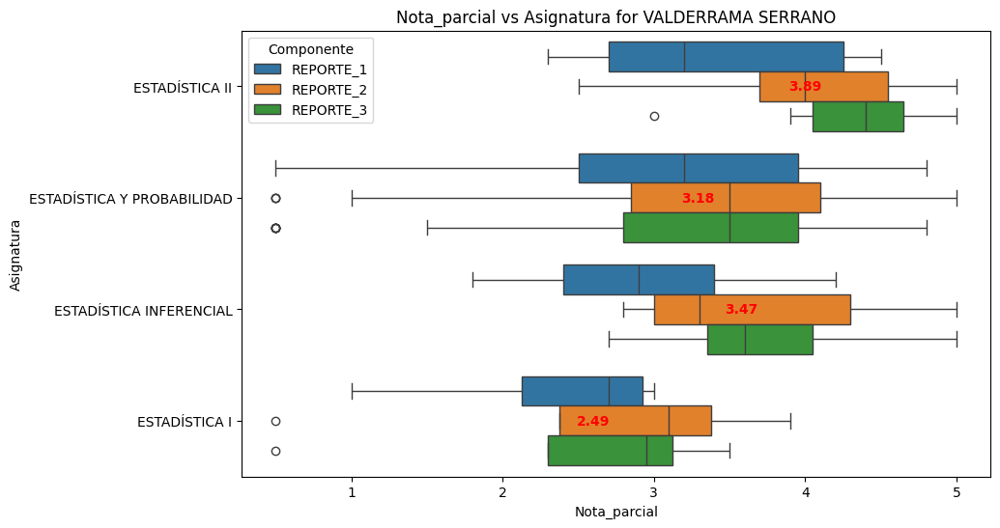

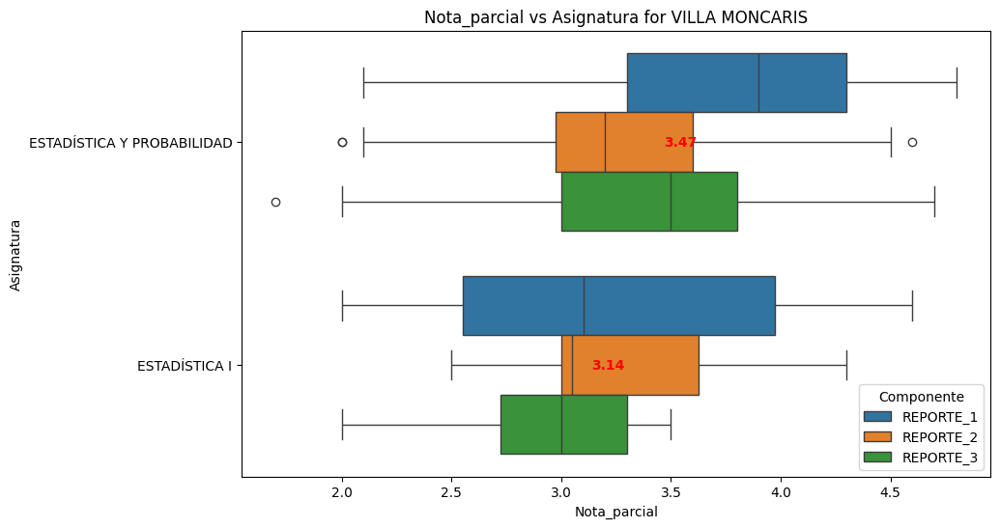

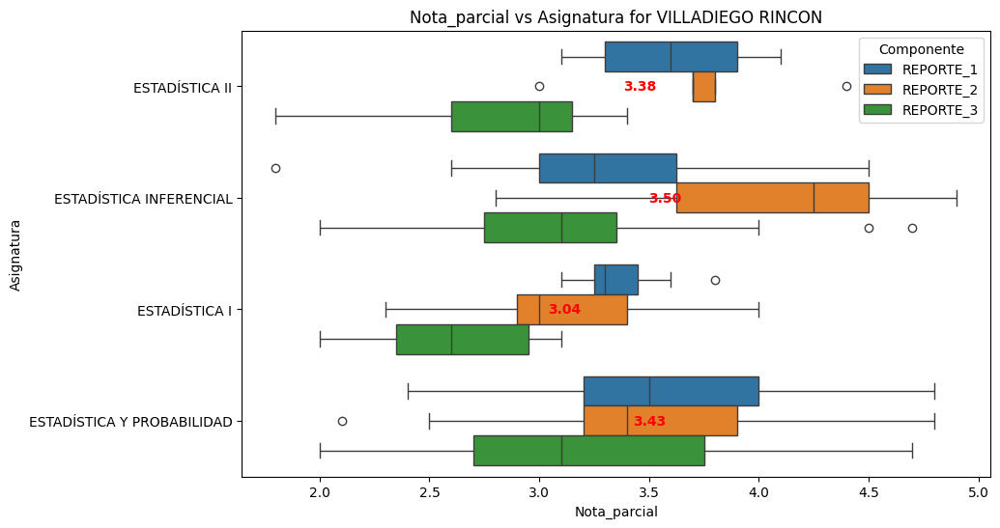

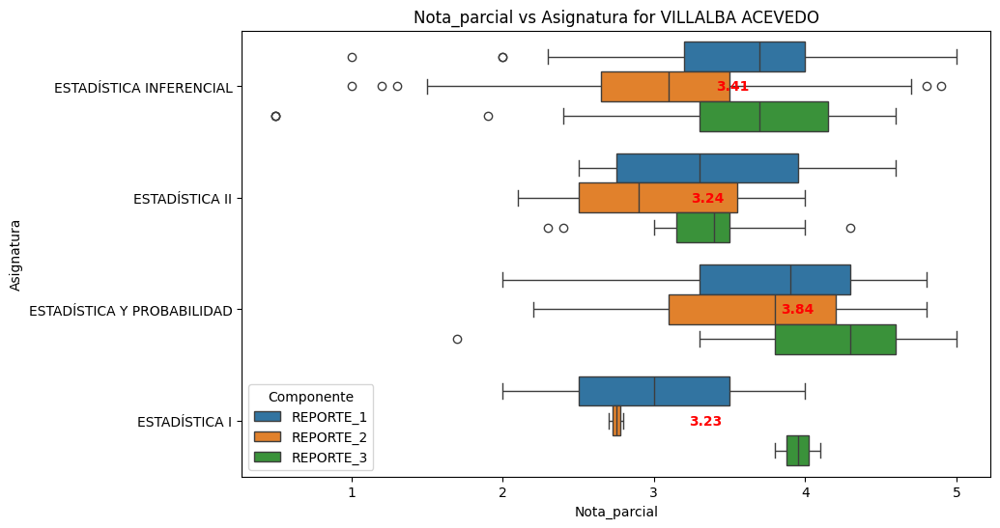

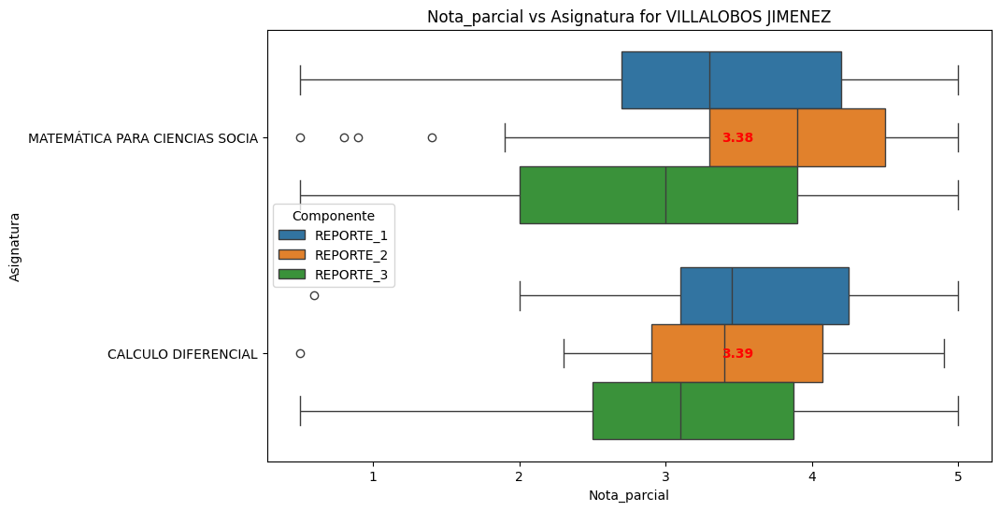

In [ ]:

# Calculate the mean for each group
mean_by_group = datos.groupby('Asignatura')['Nota_parcial'].mean()

# Group data by Apellidos_docente and create separate box plots
for apellido, group_data in datos.groupby('Apellidos_docente'):
  fig, ax = plt.subplots(figsize=(10, 6))
  ax.set_title(f'Nota_parcial vs Asignatura for {apellido}')
  sns.boxplot(y="Asignatura", x="Nota_parcial", hue='Componente', data=group_data, ax=ax)

  # Calculate the mean for each group within the current apellido group
  mean_by_group = group_data.groupby('Asignatura')['Nota_parcial'].mean()

  # Add the mean values to the plot
  for i, asignatura in enumerate(group_data['Asignatura'].unique()):
    mean_value = mean_by_group[asignatura]
    ax.text(mean_value, i, f'{mean_value:.2f}', ha='left', va='center', color='red', fontweight='bold')

  plt.show()


## **6. Gráficos Generales Por Programas - Diagrama de caja y Bigotes - Incluyendo el Promedio**

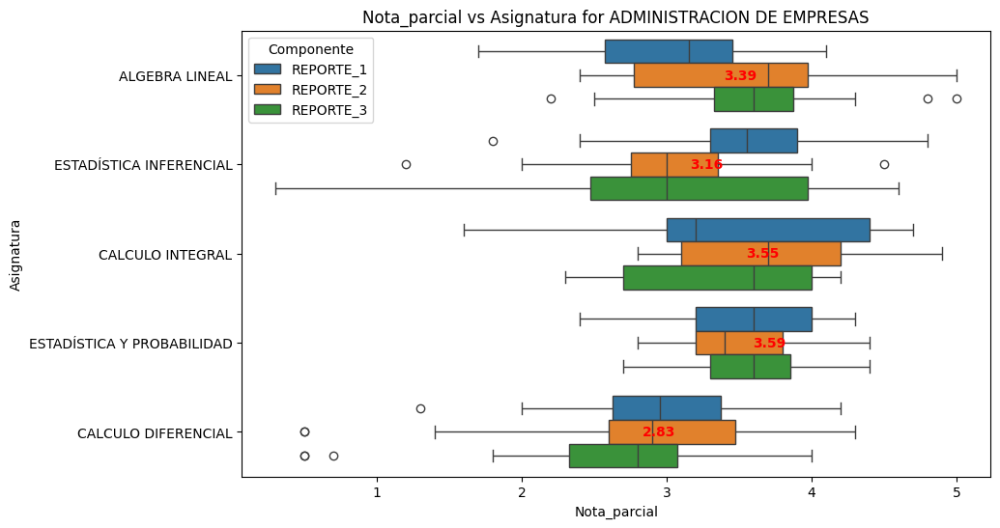

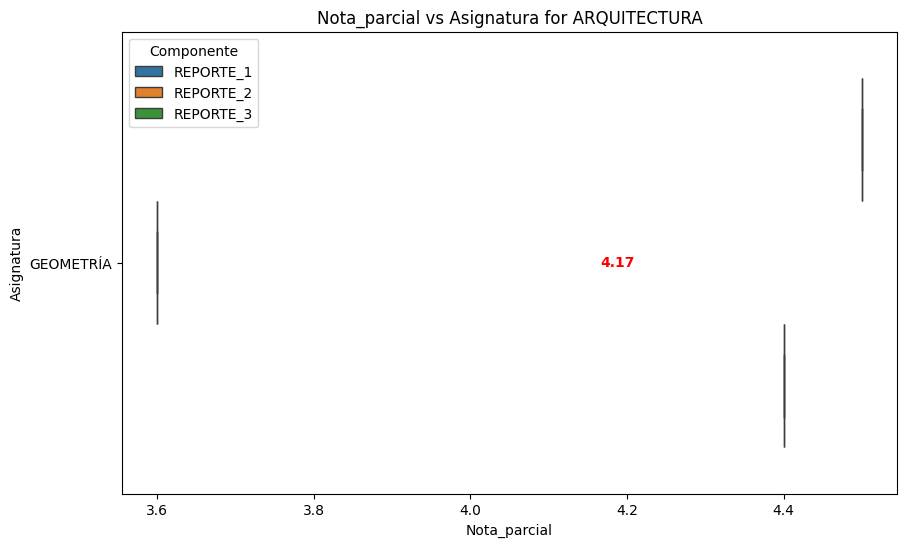

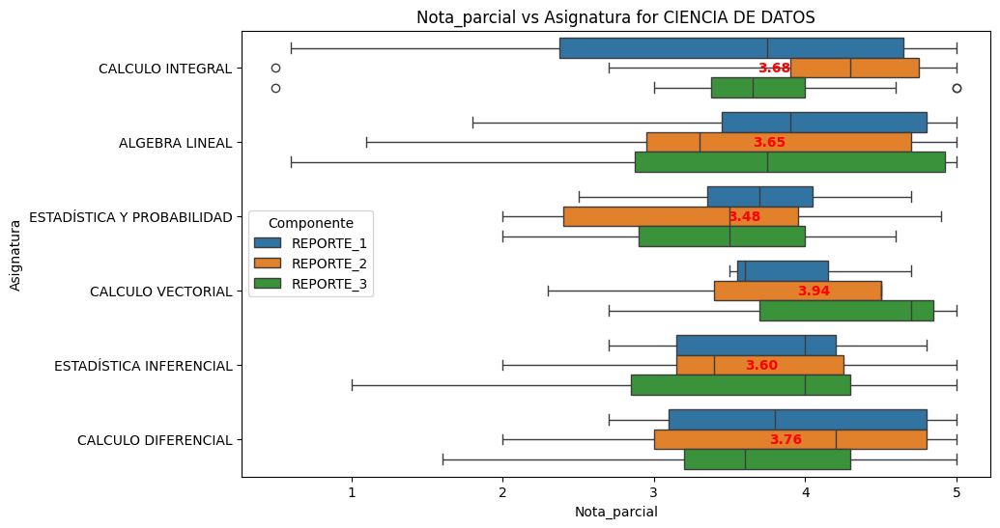

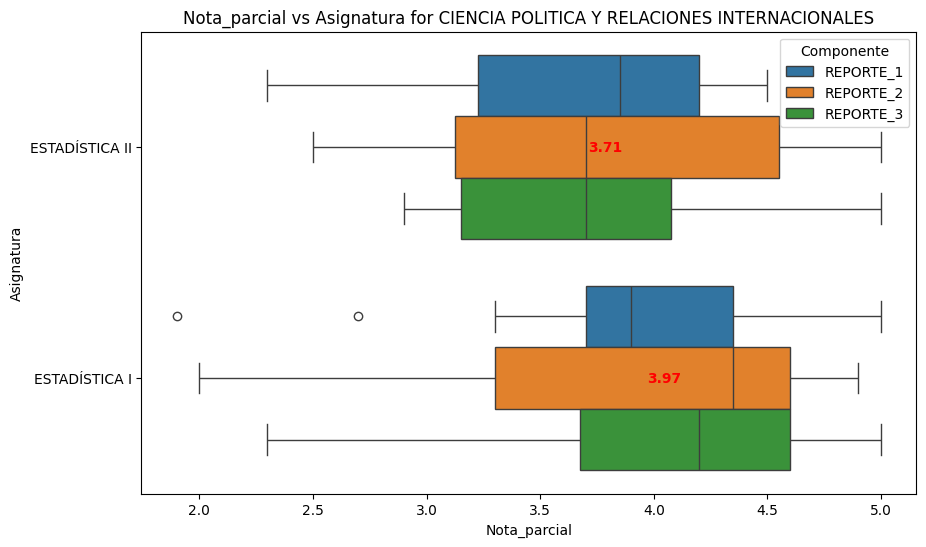

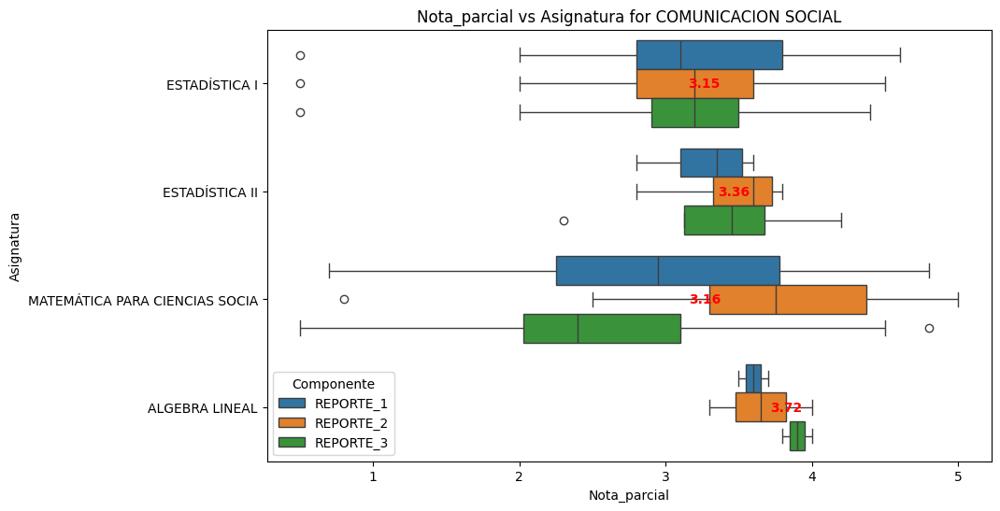

...

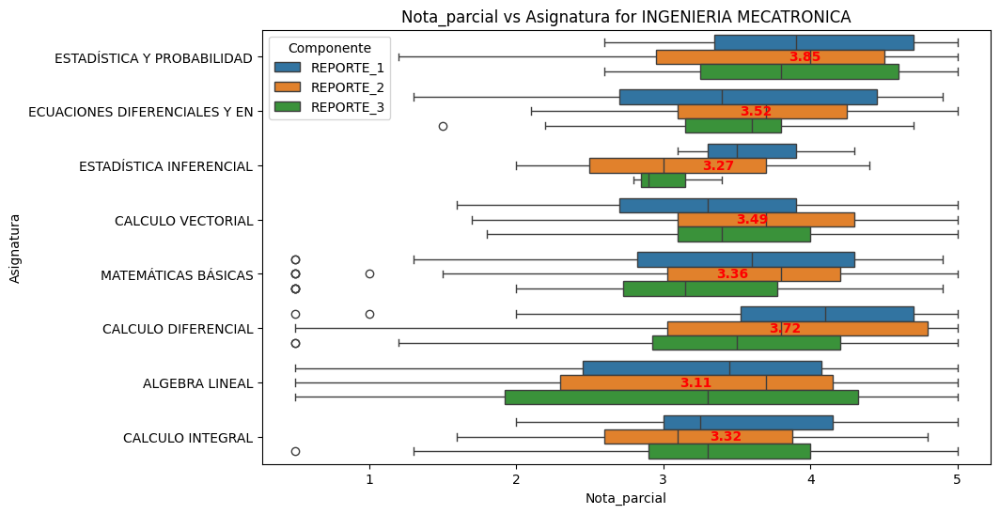

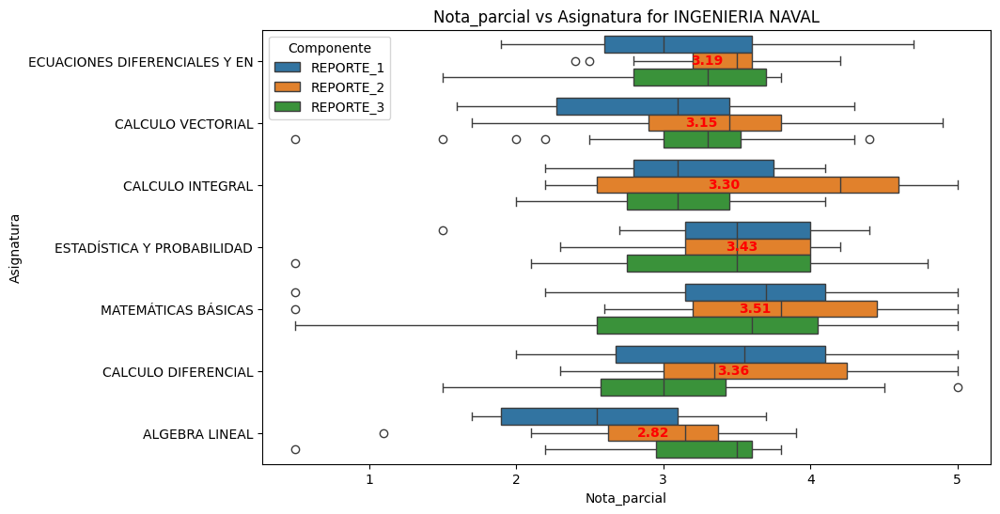

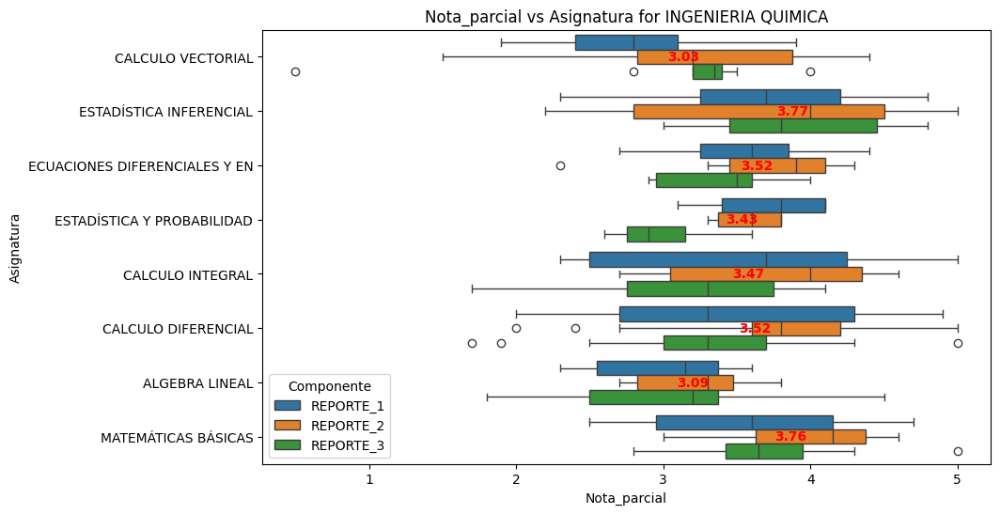

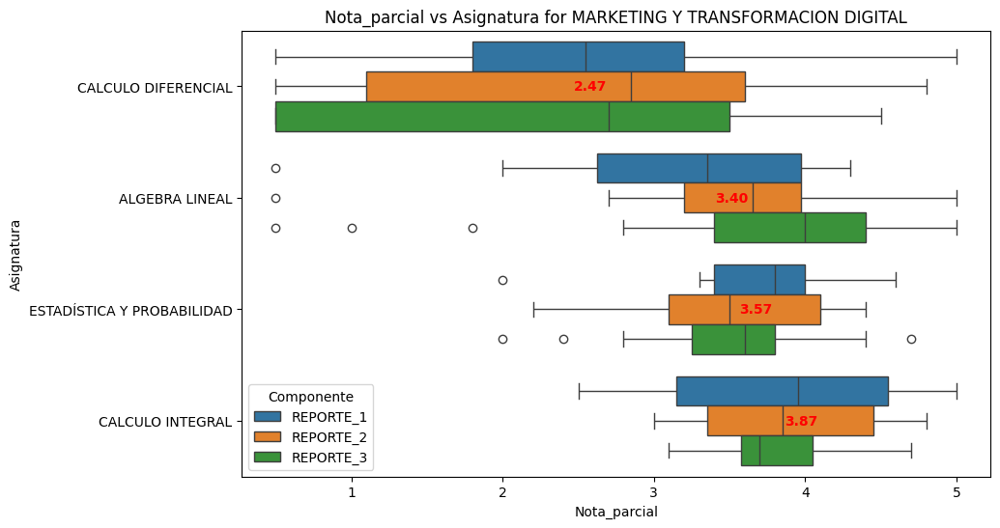

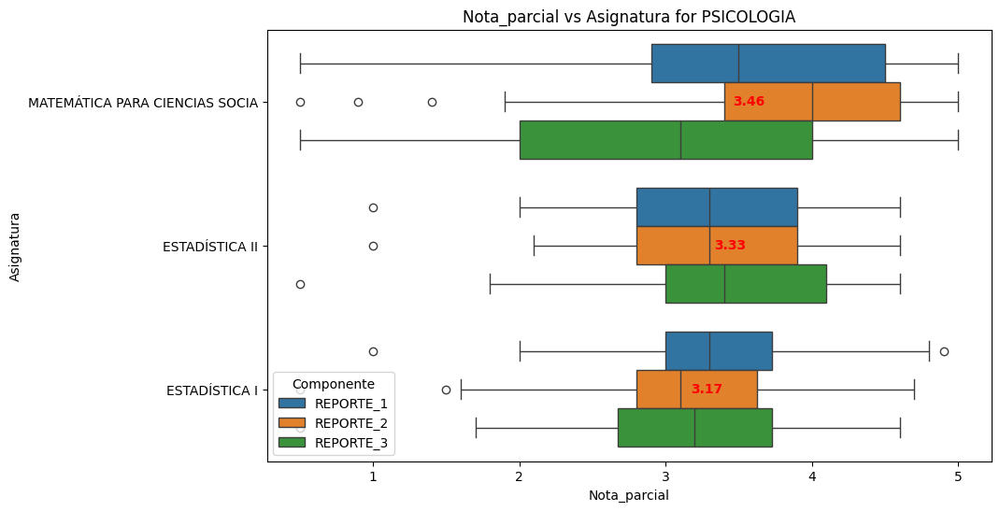

In [ ]:
# prompt: Este grafico lo puedes hacer en grupo por apellidos, que no salgan todos en un mismo grafico

# Group data by Apellidos_docente and create separate box plots
for apellido, group_data in datos.groupby('Programa'):
  fig, ax = plt.subplots(figsize=(10, 6))
  ax.set_title(f'Nota_parcial vs Asignatura for {apellido}')
  sns.boxplot(y="Asignatura", x="Nota_parcial", hue='Componente', data=group_data, ax=ax)

  # Calculate the mean for each group within the current apellido group
  mean_by_group = group_data.groupby('Asignatura')['Nota_parcial'].mean()

  # Add the mean values to the plot
  for i, asignatura in enumerate(group_data['Asignatura'].unique()):
    mean_value = mean_by_group[asignatura]
    ax.text(mean_value, i, f'{mean_value:.2f}', ha='left', va='center', color='red', fontweight='bold')

  plt.show()


In [ ]:
datos.columns

Index(['Id_estudiante', 'Apellidos_estudiante', 'Nombres_estudiante',
       'Situacion_academica', 'Becas', 'Email', 'Telefono', 'Celular',
       'Programa', 'Cod_prog', 'Periodo', 'Cod_tipo', 'Tipo_estudiante', 'Nrc',
       'Materia', 'Curso', 'Parte_periodo', 'Asignatura', 'Creditos', 'Sesion',
       'Cod_estatus', 'Estatus', 'Cod_comp', 'Componente', 'Nota_parcial',
       'Cod_subcomp', 'Subcomponente', 'Nota_parcial_subcomponente',
       'Id_docente', 'Apellidos_docente', 'Nombres_docente',
       'Nro_componentes'],
      dtype='object')

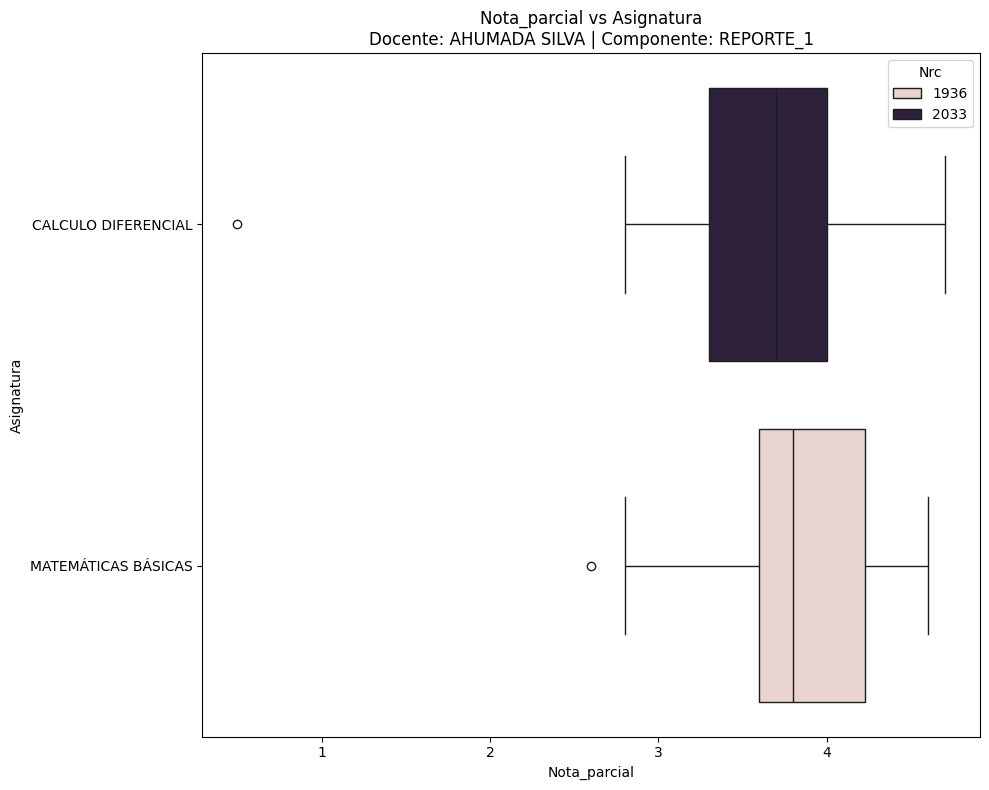

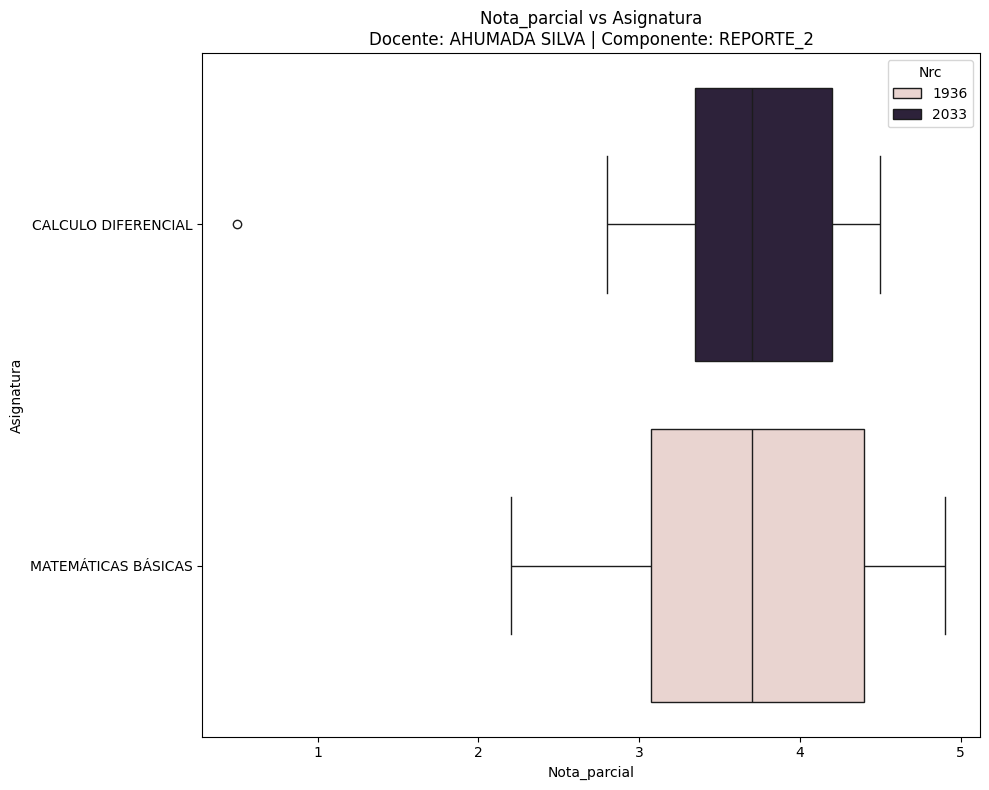

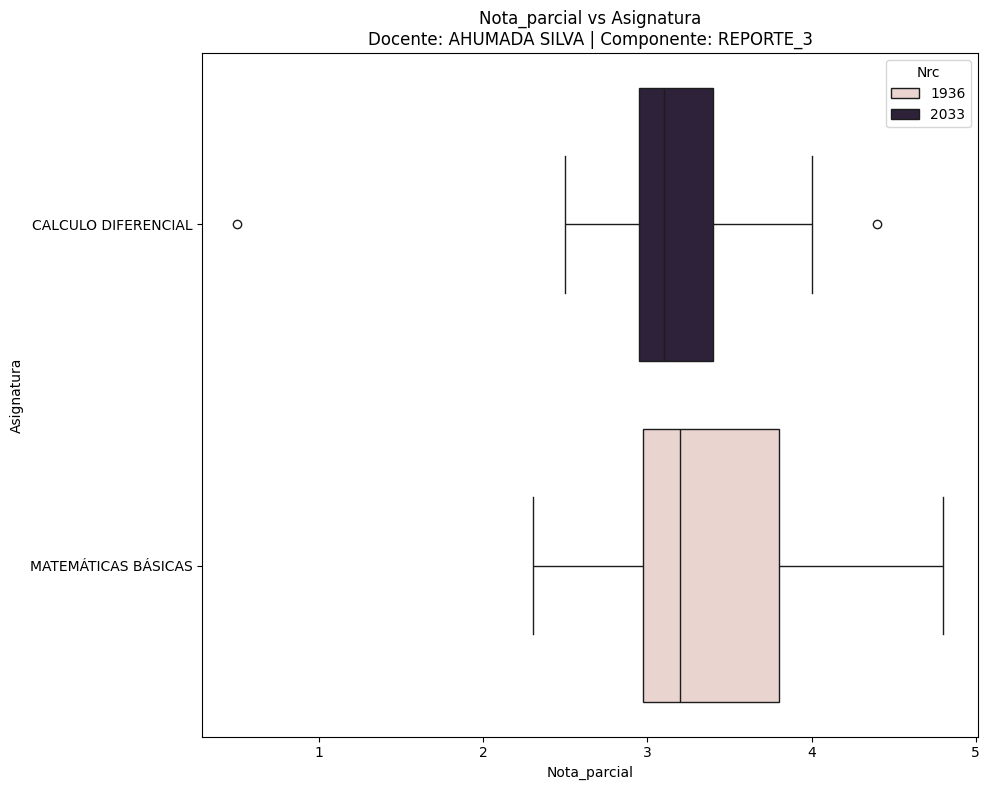

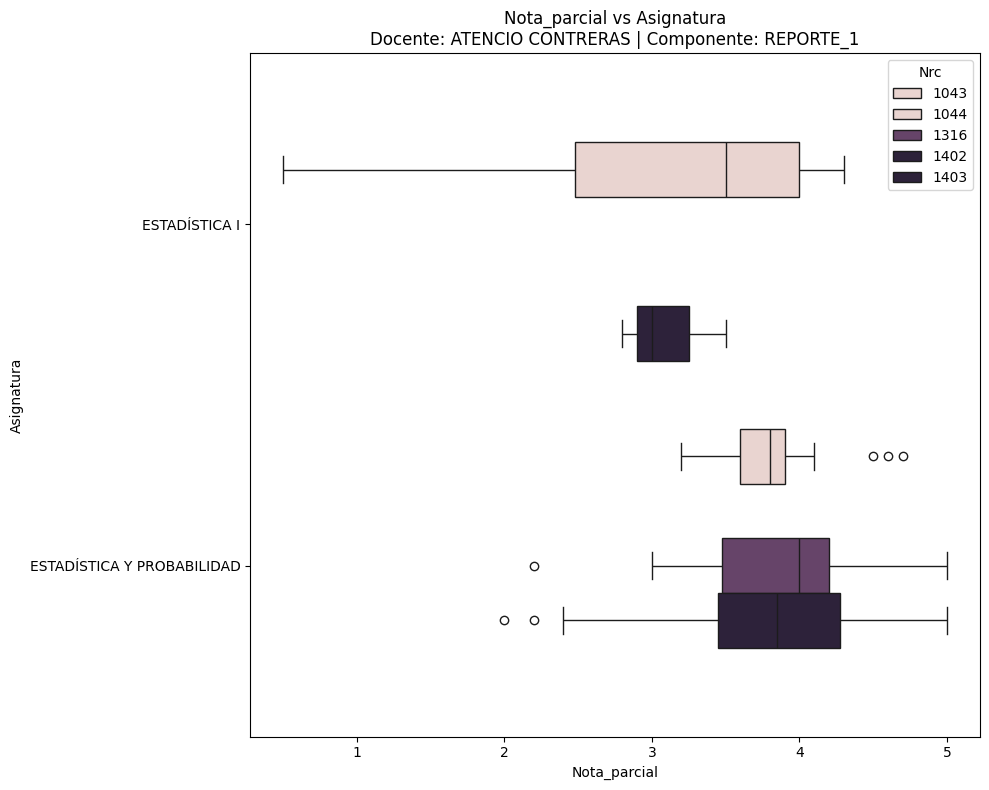

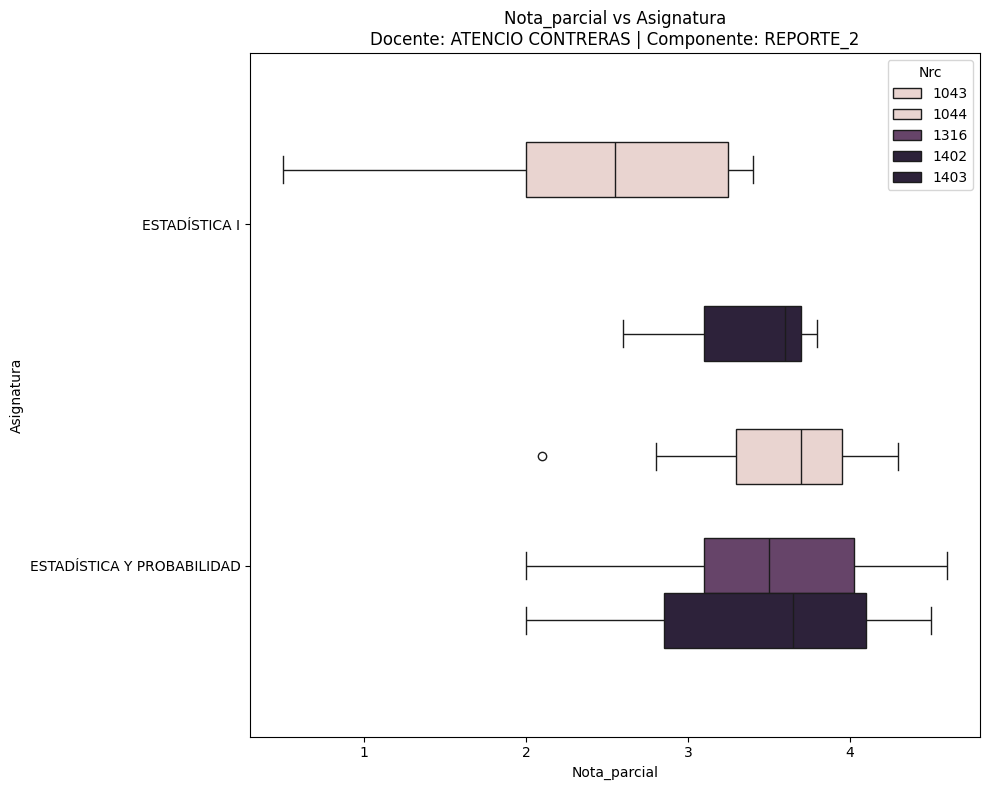

...

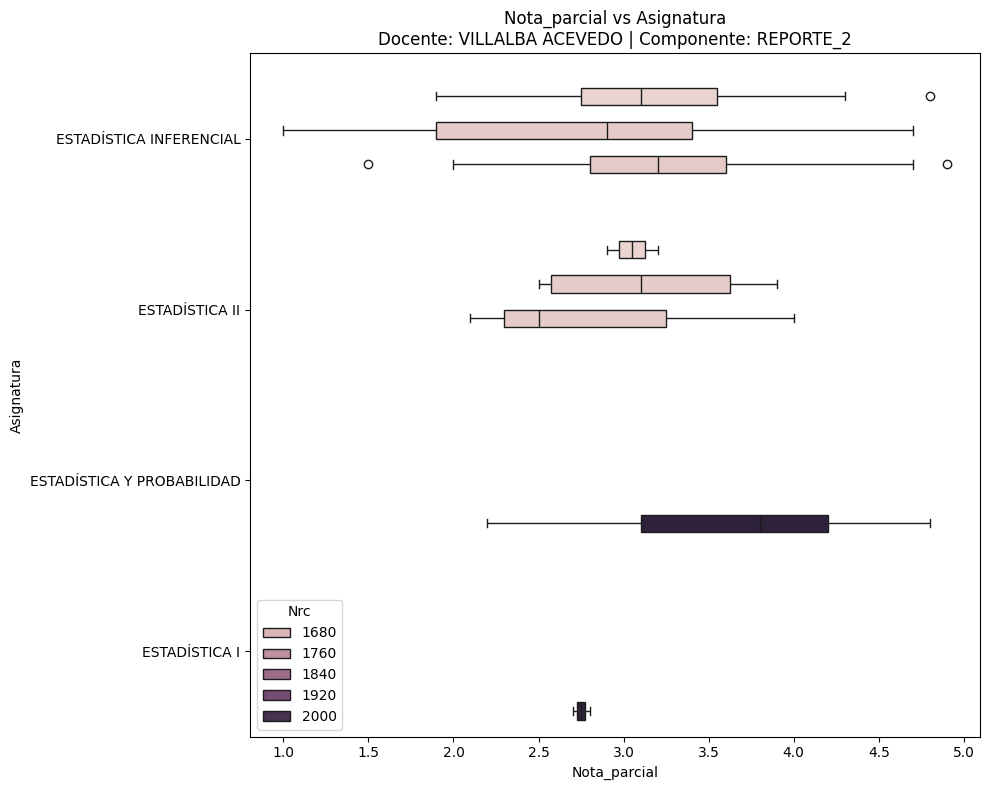

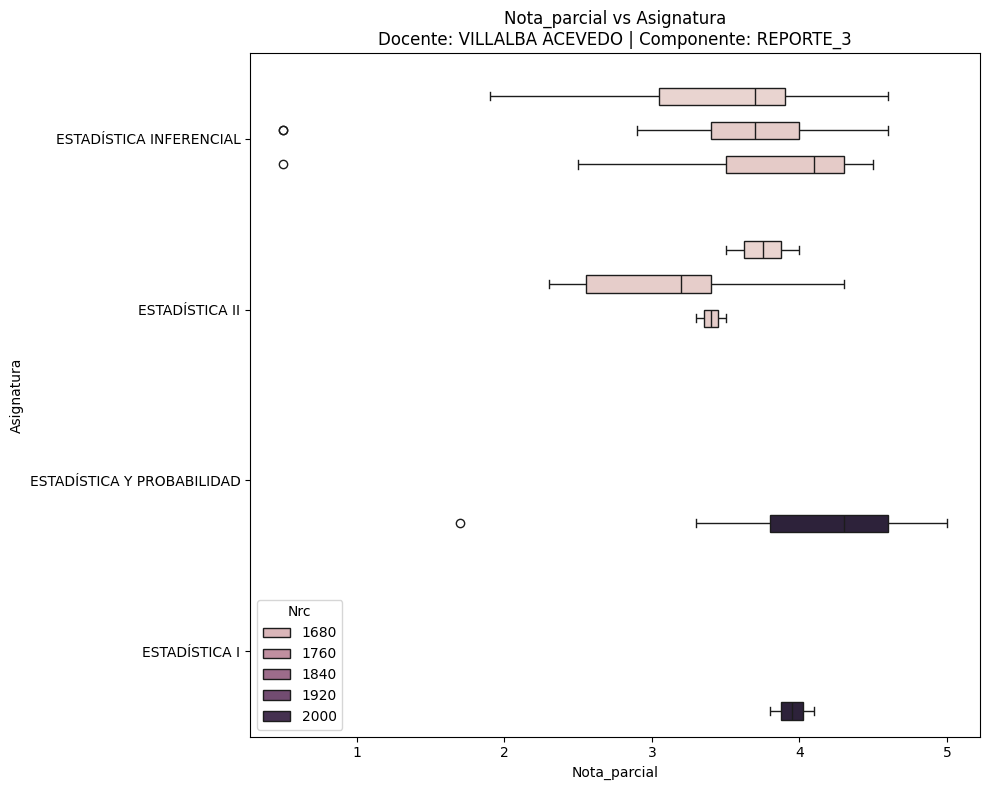

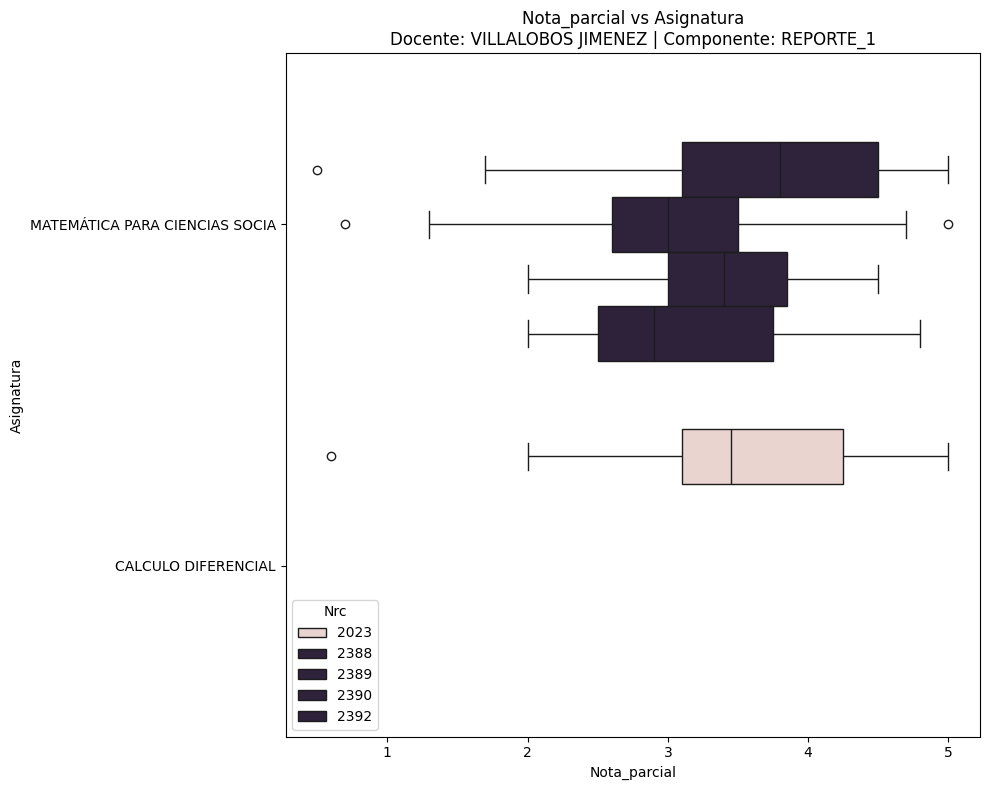

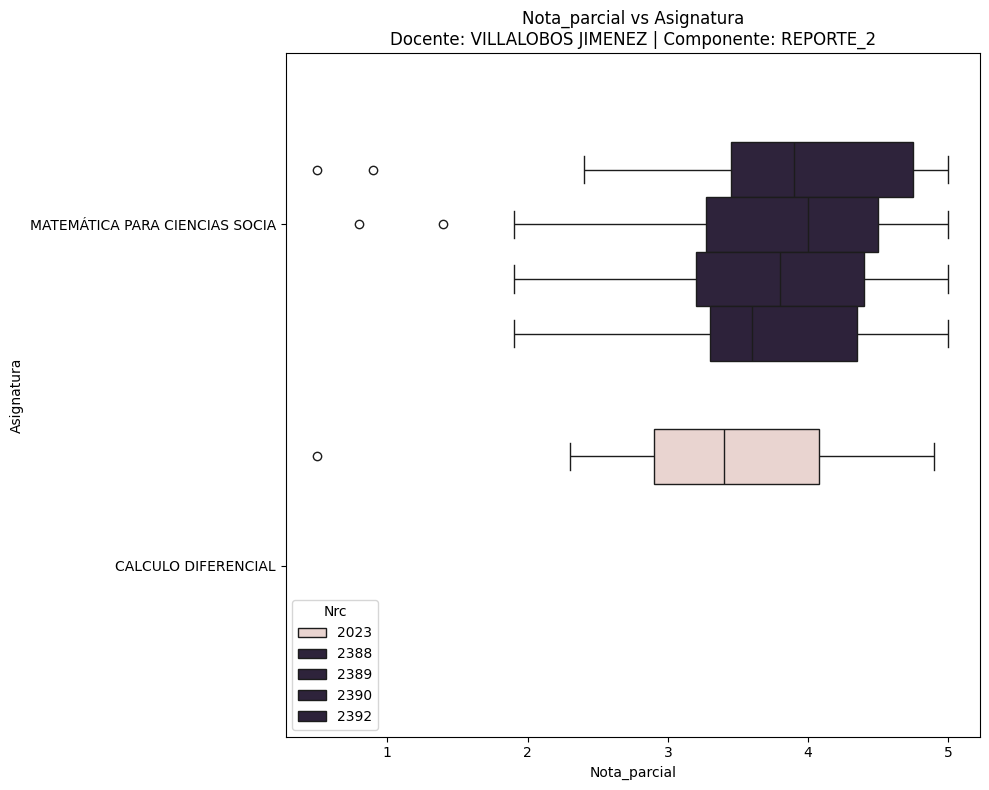

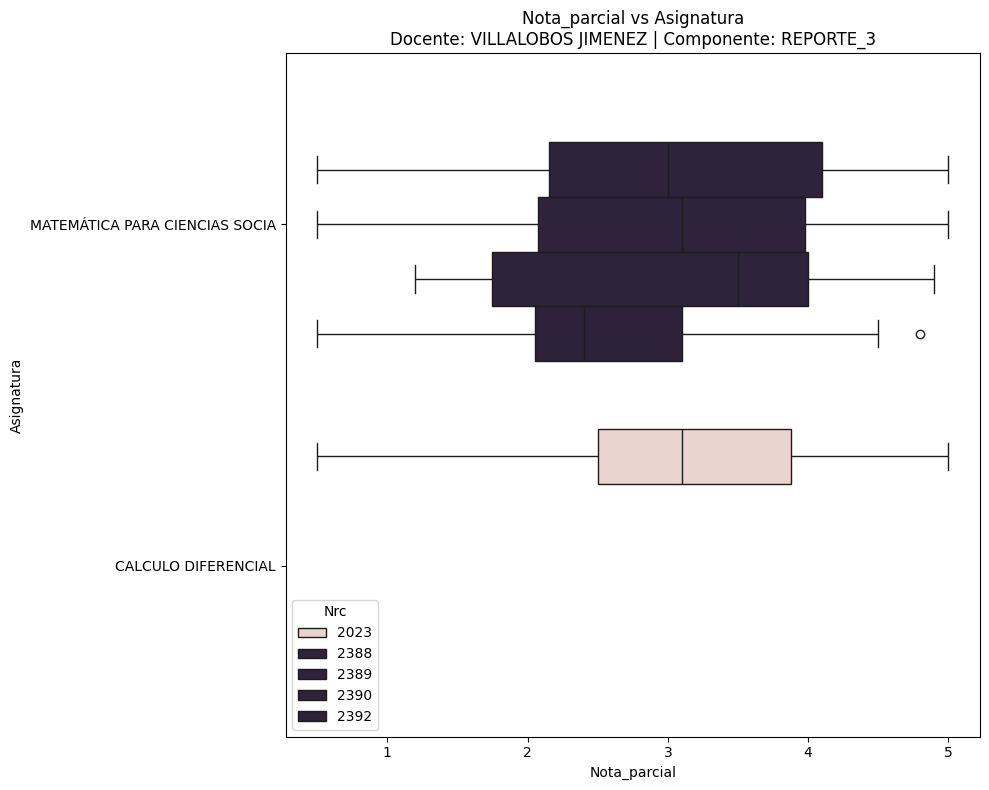

In [ ]:
# Gráficos por Docente y Componente - Diagrama de caja y Bigotes (con medias y cuartiles)
for docente, grupo_docente in datos.groupby('Apellidos_docente'):
    for componente, grupo_componente in grupo_docente.groupby('Componente'):
        fig, ax = plt.subplots(figsize=(10, 8))
        ax.set_title(f'Nota_parcial vs Asignatura\nDocente: {docente} | Componente: {componente}')
        sns.boxplot(y="Asignatura", x="Nota_parcial", hue="Nrc", data=grupo_componente, ax=ax)
        plt.tight_layout()
        plt.show()


In [ ]:
import pandas as pd
import numpy as np

# Supongamos que tienes un DataFrame llamado `datos` con las columnas: Docente, Asignatura, Nrc2, Nota_parcial

# Función para calcular el coeficiente de variación (cv)
def coeficiente_variacion(x):
    return (np.std(x, ddof=1) / np.mean(x)) * 100  # ddof=1 para desviación estándar muestral

# Calcular las métricas por combinación de Docente, Asignatura y Nrc2
tabla_estadisticas = datos.groupby(['Apellidos_docente', 'Asignatura', 'Nrc', 'Componente'])['Nota_parcial'].agg(
    media=np.mean,
    q1=lambda x: np.quantile(x, 0.25),  # Primer cuartil (Q1)
    q3=lambda x: np.quantile(x, 0.75),  # Tercer cuartil (Q3)
    sd=np.std,  # Desviación estándar
    cv=coeficiente_variacion,  # Coeficiente de variación
    minimo=np.min,  # Mínimo
    maximo=np.max  # Máximo
).reset_index()

# Mostrar la tabla de estadísticas
print(tabla_estadisticas)

# Exportar la tabla a un archivo de Excel
nombre_archivo_excel = 'tabla_estadisticas.xlsx'
tabla_estadisticas.to_excel(nombre_archivo_excel, index=False)

print(f"La tabla ha sido exportada a {nombre_archivo_excel}")

<ipython-input-61-7ccaa22f0c34>:11: FutureWarning: The provided callable <function mean at 0x7e0601a12340> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  tabla_estadisticas = datos.groupby(['Apellidos_docente', 'Asignatura', 'Nrc', 'Componente'])['Nota_parcial'].agg(
<ipython-input-61-7ccaa22f0c34>:11: FutureWarning: The provided callable <function std at 0x7e0601a12480> is currently using SeriesGroupBy.std. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "std" instead.
  tabla_estadisticas = datos.groupby(['Apellidos_docente', 'Asignatura', 'Nrc', 'Componente'])['Nota_parcial'].agg(


      Apellidos_docente                      Asignatura   Nrc Componente  \
0         AHUMADA SILVA             CALCULO DIFERENCIAL  2033  REPORTE_1   
1         AHUMADA SILVA             CALCULO DIFERENCIAL  2033  REPORTE_2   
2         AHUMADA SILVA             CALCULO DIFERENCIAL  2033  REPORTE_3   
3         AHUMADA SILVA             MATEMÁTICAS BÁSICAS  1936  REPORTE_1   
4         AHUMADA SILVA             MATEMÁTICAS BÁSICAS  1936  REPORTE_2   
..                  ...                             ...   ...        ...   
424  VILLALOBOS JIMENEZ  MATEMÁTICA PARA CIENCIAS SOCIA  2390  REPORTE_2   
425  VILLALOBOS JIMENEZ  MATEMÁTICA PARA CIENCIAS SOCIA  2390  REPORTE_3   
426  VILLALOBOS JIMENEZ  MATEMÁTICA PARA CIENCIAS SOCIA  2392  REPORTE_1   
427  VILLALOBOS JIMENEZ  MATEMÁTICA PARA CIENCIAS SOCIA  2392  REPORTE_2   
428  VILLALOBOS JIMENEZ  MATEMÁTICA PARA CIENCIAS SOCIA  2392  REPORTE_3   

        media     q1     q3        sd         cv  minimo  maximo  
0    3.587179  3.300

<ipython-input-61-7ccaa22f0c34>:11: FutureWarning: The provided callable <function min at 0x7e0601a11a80> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  tabla_estadisticas = datos.groupby(['Apellidos_docente', 'Asignatura', 'Nrc', 'Componente'])['Nota_parcial'].agg(
<ipython-input-61-7ccaa22f0c34>:11: FutureWarning: The provided callable <function max at 0x7e0601a11940> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  tabla_estadisticas = datos.groupby(['Apellidos_docente', 'Asignatura', 'Nrc', 'Componente'])['Nota_parcial'].agg(


In [ ]:
import pandas as pd
import numpy as np

# Supongamos que tienes un DataFrame llamado `datos` con las columnas: Docente, Asignatura, Nrc2, Nota_parcial

# Función para calcular el coeficiente de variación (cv)
def coeficiente_variacion(x):
    return (np.std(x, ddof=1) / np.mean(x)) * 100  # ddof=1 para desviación estándar muestral

# Calcular las métricas por combinación de Docente, Asignatura y Nrc2
tabla_estadisticas = datos.groupby(['Nombres_docente', 'Asignatura', 'Nrc', 'Componente']).agg(
    media=('Nota_parcial', np.mean),
    q1=('Nota_parcial', lambda x: np.quantile(x, 0.25)),  # Primer cuartil (Q1)
    q3=('Nota_parcial', lambda x: np.quantile(x, 0.75)),  # Tercer cuartil (Q3)
    sd=('Nota_parcial', np.std),  # Desviación estándar
    cv=('Nota_parcial', coeficiente_variacion),  # Coeficiente de variación
    minimo=('Nota_parcial', np.min),  # Mínimo
    maximo=('Nota_parcial', np.max),  # Máximo
    estudiantes_menor_3=('Nota_parcial', lambda x: (x < 2.95).sum()),  # Estudiantes con Nota_parcial < 2.9
    estudiantes_mayor_3=('Nota_parcial', lambda x: (x > 2.95).sum()),  # Estudiantes con Nota_parcial > 3.0
    porcentaje_menor_3=('Nota_parcial', lambda x: (x < 2.95).mean() * 100),  # Porcentaje de estudiantes con Nota_parcial < 2.9
    porcentaje_mayor_3=('Nota_parcial', lambda x: (x > 2.95).mean() * 100)  # Porcentaje de estudiantes con Nota_parcial > 3.0
).reset_index()

# Mostrar la tabla de estadísticas
print(tabla_estadisticas)

# Exportar la tabla a un archivo de Excel
nombre_archivo_excel = 'tabla_estadisticas.xlsx'
tabla_estadisticas.to_excel(nombre_archivo_excel, index=False)

print(f"La tabla ha sido exportada a {nombre_archivo_excel}")

<ipython-input-62-1d602af04b64>:11: FutureWarning: The provided callable <function mean at 0x7e0601a12340> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  tabla_estadisticas = datos.groupby(['Nombres_docente', 'Asignatura', 'Nrc', 'Componente']).agg(
<ipython-input-62-1d602af04b64>:11: FutureWarning: The provided callable <function std at 0x7e0601a12480> is currently using SeriesGroupBy.std. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "std" instead.
  tabla_estadisticas = datos.groupby(['Nombres_docente', 'Asignatura', 'Nrc', 'Componente']).agg(
<ipython-input-62-1d602af04b64>:11: FutureWarning: The provided callable <function min at 0x7e0601a11a80> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass

      Nombres_docente           Asignatura   Nrc Componente     media     q1  \
0    ADRIANA CAROLINA       ALGEBRA LINEAL  1305  REPORTE_1  2.705263  2.500   
1    ADRIANA CAROLINA       ALGEBRA LINEAL  1305  REPORTE_2  2.936842  2.400   
2    ADRIANA CAROLINA       ALGEBRA LINEAL  1305  REPORTE_3  3.000000  2.550   
3    ADRIANA CAROLINA       ALGEBRA LINEAL  2064  REPORTE_1  2.775862  2.200   
4    ADRIANA CAROLINA       ALGEBRA LINEAL  2064  REPORTE_2  2.924138  2.000   
..                ...                  ...   ...        ...       ...    ...   
424     WENDY YURANIS  MATEMÁTICAS BÁSICAS  1762  REPORTE_2  3.467500  3.175   
425     WENDY YURANIS  MATEMÁTICAS BÁSICAS  1762  REPORTE_3  2.827500  2.275   
426     WENDY YURANIS  MATEMÁTICAS BÁSICAS  1811  REPORTE_1  3.769231  3.150   
427     WENDY YURANIS  MATEMÁTICAS BÁSICAS  1811  REPORTE_2  3.533333  3.050   
428     WENDY YURANIS  MATEMÁTICAS BÁSICAS  1811  REPORTE_3  3.025641  2.500   

        q3        sd         cv  minimo

In [ ]:
# Load the CSV from the URL
datos2 = pd.read_csv("/content/2025_DEF_SEM1_2.csv", delimiter=';')
datos2

,Id_estudiante,Apellidos_estudiante,Nombres_estudiante,Situacion_academica,Becas,Email,Telefono,Celular,Programa,Cod_prog,...,Cod_comp,Componente,Nota_parcial,DEFINITIVA,Subcomponente,Nota_parcial_subcomponente,Id_docente,Apellidos_docente,Nombres_docente,Nro_componentes
0,T00038684,HERNANDEZ RODRIGUEZ,KEVIN,NaN,NaN,kevinhernandez1997@hotmail.com,035-6412035,57-3116786353,INGENIERIA CIVIL,7,...,REP1,REPORTE_1,3.0,3.245,NaN,NaN,T00081920,MARTINEZ PIÑA,LAURA NATALIA,3
1,T00038684,HERNANDEZ RODRIGUEZ,KEVIN,NaN,NaN,kevinhernandez1997@hotmail.com,035-6412035,57-3116786353,INGENIERIA CIVIL,7,...,REP2,REPORTE_2,2.8,NaN,NaN,NaN,T00081920,MARTINEZ PIÑA,LAURA NATALIA,3
2,T00038684,HERNANDEZ RODRIGUEZ,KEVIN,NaN,NaN,kevinhernandez1997@hotmail.com,035-6412035,57-3116786353,INGENIERIA CIVIL,7,...,REP3,REPORTE_3,3.9,NaN,NaN,NaN,T00081920,MARTINEZ PIÑA,LAURA NATALIA,3
3,T00039255,HOY RODRIGUEZ,LUIS ANTONIO,NaN,NaN,luis_antonio_hoy_r@hotmail.com,605-6622748,57-3024845453,INGENIERIA MECANICA,3,...,REP1,REPORTE_1,3.4,3.645,NaN,NaN,T00024984,CABARCAS URRIOLA,HECTOR JOSE,3
4,T00039255,HOY RODRIGUEZ,LUIS ANTONIO,NaN,NaN,luis_antonio_hoy_r@hotmail.com,605-6622748,57-3024845453,INGENIERIA MECANICA,3,...,REP2,REPORTE_2,4.1,NaN,NaN,NaN,T00024984,CABARCAS URRIOLA,HECTOR JOSE,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9874,T00091981,TOVAR DIAZ,YEISON ESTIVEN,NaN,NaN,stiventovardiaz27@gmail.com,3146261779,57-3146261779,INGENIERIA CIVIL,7,...,REP2,REPORTE_2,2.4,NaN,NaN,NaN,T00047939,OLIVERA BELTRAN,GIOVANNI,3
9875,T00091981,TOVAR DIAZ,YEISON ESTIVEN,NaN,NaN,stiventovardiaz27@gmail.com,3146261779,57-3146261779,INGENIERIA CIVIL,7,...,REP3,REPORTE_3,2.3,NaN,NaN,NaN,T00047939,OLIVERA BELTRAN,GIOVANNI,3
9876,T00091981,TOVAR DIAZ,YEISON ESTIVEN,NaN,NaN,stiventovardiaz27@gmail.com,3146261779,57-3146261779,INGENIERIA CIVIL,7,...,REP1,REPORTE_1,2.1,2.660,NaN,NaN,T00001541,BARRIOS HERNANDEZ,EDER ANTONIO,3
9877,T00091981,TOVAR DIAZ,YEISON ESTIVEN,NaN,NaN,stiventovardiaz27@gmail.com,3146261779,57-3146261779,INGENIERIA CIVIL,7,...,REP2,REPORTE_2,3.2,NaN,NaN,NaN,T00001541,BARRIOS HERNANDEZ,EDER ANTONIO,3


In [ ]:
datos2.columns

Index(['Id_estudiante', 'Apellidos_estudiante', 'Nombres_estudiante',
       'Situacion_academica', 'Becas', 'Email', 'Telefono', 'Celular',
       'Programa', 'Cod_prog', 'Periodo', 'Cod_tipo', 'Tipo_estudiante', 'Nrc',
       'Materia', 'Curso', 'Parte_periodo', 'Asignatura', 'Creditos', 'Sesion',
       'Cod_estatus', 'Estatus', 'Cod_comp', 'Componente', 'Nota_parcial',
       'DEFINITIVA', 'Subcomponente', 'Nota_parcial_subcomponente',
       'Id_docente', 'Apellidos_docente', 'Nombres_docente',
       'Nro_componentes'],
      dtype='object')

In [ ]:
import pandas as pd
import numpy as np

# Supongamos que tienes un DataFrame llamado `datos` con las columnas: Docente, Asignatura, Nrc2, Nota_parcial

# Función para calcular el coeficiente de variación (cv)
def coeficiente_variacion(x):
    return (np.std(x, ddof=1) / np.mean(x)) * 100  # ddof=1 para desviación estándar muestral

# Calcular las métricas por combinación de Docente, Asignatura y Nrc2
tabla_estadisticas2 = datos2.groupby(['Nombres_docente', 'Asignatura', 'Nrc', 'Componente','Programa']).agg(
    media=('DEFINITIVA', np.mean),
    q1=('DEFINITIVA', lambda x: np.quantile(x, 0.25)),  # Primer cuartil (Q1)
    q3=('DEFINITIVA', lambda x: np.quantile(x, 0.75)),  # Tercer cuartil (Q3)
    sd=('DEFINITIVA', np.std),  # Desviación estándar
    cv=('DEFINITIVA', coeficiente_variacion),  # Coeficiente de variación
    minimo=('DEFINITIVA', np.min),  # Mínimo
    maximo=('DEFINITIVA', np.max),  # Máximo
    estudiantes_menor_3=('DEFINITIVA', lambda x: (x < 2.95).sum()),  # Estudiantes con DEFINITIVA < 2.9
    estudiantes_mayor_3=('DEFINITIVA', lambda x: (x > 2.95).sum()),  # Estudiantes con DEFINITIVA > 3.0
    porcentaje_menor_3=('DEFINITIVA', lambda x: (x < 2.95).mean() * 100),  # Porcentaje de estudiantes con DEFINITIVA < 2.9
    porcentaje_mayor_3=('DEFINITIVA', lambda x: (x > 2.95).mean() * 100)  # Porcentaje de estudiantes con Nota_parcial > 3.0
).reset_index()

# Mostrar la tabla de estadísticas
print(tabla_estadisticas2)

# Exportar la tabla a un archivo de Excel
nombre_archivo_excel = 'tabla_estadisticas2.xlsx'
tabla_estadisticas2.to_excel(nombre_archivo_excel, index=False)

print(f"La tabla ha sido exportada a {nombre_archivo_excel}")

<ipython-input-78-331b40d0d96f>:11: FutureWarning: The provided callable <function mean at 0x7e0601a12340> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  tabla_estadisticas2 = datos2.groupby(['Nombres_docente', 'Asignatura', 'Nrc', 'Componente','Programa']).agg(
<ipython-input-78-331b40d0d96f>:11: FutureWarning: The provided callable <function std at 0x7e0601a12480> is currently using SeriesGroupBy.std. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "std" instead.
  tabla_estadisticas2 = datos2.groupby(['Nombres_docente', 'Asignatura', 'Nrc', 'Componente','Programa']).agg(
<ipython-input-78-331b40d0d96f>:11: FutureWarning: The provided callable <function min at 0x7e0601a11a80> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To 

       Nombres_docente           Asignatura   Nrc Componente  \
0     ADRIANA CAROLINA       ALGEBRA LINEAL  1305  REPORTE_1   
1     ADRIANA CAROLINA       ALGEBRA LINEAL  1305  REPORTE_1   
2     ADRIANA CAROLINA       ALGEBRA LINEAL  1305  REPORTE_1   
3     ADRIANA CAROLINA       ALGEBRA LINEAL  1305  REPORTE_1   
4     ADRIANA CAROLINA       ALGEBRA LINEAL  1305  REPORTE_1   
...                ...                  ...   ...        ...   
2884     WENDY YURANIS  MATEMÁTICAS BÁSICAS  1811  REPORTE_3   
2885     WENDY YURANIS  MATEMÁTICAS BÁSICAS  1811  REPORTE_3   
2886     WENDY YURANIS  MATEMÁTICAS BÁSICAS  1811  REPORTE_3   
2887     WENDY YURANIS  MATEMÁTICAS BÁSICAS  1811  REPORTE_3   
2888     WENDY YURANIS  MATEMÁTICAS BÁSICAS  1811  REPORTE_3   

                                  Programa   media       q1       q3  \
0               ADMINISTRACION DE EMPRESAS  3.8850  3.88500  3.88500   
1      FINANZAS Y NEGOCIOS INTERNACIONALES  2.7675  2.32500  3.13250   
2              

In [ ]:
# Load the Excel file
datos3 = pd.read_excel("/content/tabla_estadisticas2.xlsx")
datos3

,Nombres_docente,Asignatura,Nrc,Componente,Programa,media,q1,q3,sd,cv,minimo,maximo,estudiantes_menor_3,estudiantes_mayor_3,porcentaje_menor_3,porcentaje_mayor_3
0,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,REPORTE_1,ADMINISTRACION DE EMPRESAS,3.8850,3.88500,3.88500,NaN,NaN,3.885,3.885,0,1,0.0,100.0
1,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,REPORTE_1,FINANZAS Y NEGOCIOS INTERNACIONALES,2.7675,2.32500,3.13250,0.649070,23.453292,2.115,3.575,2,2,50.0,50.0
2,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,REPORTE_1,INGENIERIA BIOMEDICA,2.7400,2.74000,2.74000,NaN,NaN,2.740,2.740,1,0,100.0,0.0
3,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,REPORTE_1,INGENIERIA CIVIL,2.8100,2.69625,3.30875,0.860068,30.607396,1.530,3.320,1,3,25.0,75.0
4,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,REPORTE_1,INGENIERIA DE SISTEMAS Y COMPUTACION,3.3575,3.29625,3.41875,0.173241,5.159826,3.235,3.480,0,2,0.0,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2884,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,REPORTE_3,INGENIERIA INDUSTRIAL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.0,0.0
2885,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,REPORTE_3,INGENIERIA MECANICA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.0,0.0
2886,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,REPORTE_3,INGENIERIA MECATRONICA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.0,0.0
2887,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,REPORTE_3,INGENIERIA NAVAL,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.0,0.0


In [ ]:
# prompt: Elimina los datos NaN

datos3 = datos3.dropna()
datos3


,Nombres_docente,Asignatura,Nrc,Componente,Programa,media,q1,q3,sd,cv,minimo,maximo,estudiantes_menor_3,estudiantes_mayor_3,porcentaje_menor_3,porcentaje_mayor_3
1,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,REPORTE_1,FINANZAS Y NEGOCIOS INTERNACIONALES,2.767500,2.32500,3.13250,0.649070,23.453292,2.115,3.575,2,2,50.000000,50.000000
3,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,REPORTE_1,INGENIERIA CIVIL,2.810000,2.69625,3.30875,0.860068,30.607396,1.530,3.320,1,3,25.000000,75.000000
4,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,REPORTE_1,INGENIERIA DE SISTEMAS Y COMPUTACION,3.357500,3.29625,3.41875,0.173241,5.159826,3.235,3.480,0,2,0.000000,100.000000
5,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,REPORTE_1,INGENIERIA INDUSTRIAL,3.215000,3.06875,3.44125,0.362514,11.275719,2.720,3.550,1,3,25.000000,75.000000
6,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,REPORTE_1,INGENIERIA MECATRONICA,1.597500,1.16875,2.02625,1.212688,75.911620,0.740,2.455,2,0,100.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2866,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,REPORTE_1,INGENIERIA INDUSTRIAL,3.297500,3.26125,3.33375,0.102530,3.109340,3.225,3.370,0,2,0.000000,100.000000
2867,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,REPORTE_1,INGENIERIA MECANICA,3.471667,3.20000,3.83250,0.513767,14.798844,2.615,4.160,2,10,16.666667,83.333333
2868,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,REPORTE_1,INGENIERIA MECATRONICA,3.408750,2.81250,4.11250,1.083311,31.780298,1.250,4.590,3,5,37.500000,62.500000
2869,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,REPORTE_1,INGENIERIA NAVAL,3.615000,3.03500,4.23750,0.853683,23.615026,2.230,4.395,2,5,28.571429,71.428571


In [ ]:
datos3.columns

Index(['Nombres_docente', 'Asignatura', 'Nrc', 'Componente', 'Programa',
       'media', 'q1', 'q3', 'sd', 'cv', 'minimo', 'maximo',
       'estudiantes_menor_3', 'estudiantes_mayor_3', 'porcentaje_menor_3',
       'porcentaje_mayor_3'],
      dtype='object')

In [ ]:
datos3['Componente'] = datos3['Componente'].replace('REPORTE_1', 'NOTA_FINAL')
datos3

<ipython-input-82-f2e84aa3d497>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos3['Componente'] = datos3['Componente'].replace('REPORTE_1', 'NOTA_FINAL')


,Nombres_docente,Asignatura,Nrc,Componente,Programa,media,q1,q3,sd,cv,minimo,maximo,estudiantes_menor_3,estudiantes_mayor_3,porcentaje_menor_3,porcentaje_mayor_3
1,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,NOTA_FINAL,FINANZAS Y NEGOCIOS INTERNACIONALES,2.767500,2.32500,3.13250,0.649070,23.453292,2.115,3.575,2,2,50.000000,50.000000
3,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,NOTA_FINAL,INGENIERIA CIVIL,2.810000,2.69625,3.30875,0.860068,30.607396,1.530,3.320,1,3,25.000000,75.000000
4,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,NOTA_FINAL,INGENIERIA DE SISTEMAS Y COMPUTACION,3.357500,3.29625,3.41875,0.173241,5.159826,3.235,3.480,0,2,0.000000,100.000000
5,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,NOTA_FINAL,INGENIERIA INDUSTRIAL,3.215000,3.06875,3.44125,0.362514,11.275719,2.720,3.550,1,3,25.000000,75.000000
6,ADRIANA CAROLINA,ALGEBRA LINEAL,1305,NOTA_FINAL,INGENIERIA MECATRONICA,1.597500,1.16875,2.02625,1.212688,75.911620,0.740,2.455,2,0,100.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2866,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,NOTA_FINAL,INGENIERIA INDUSTRIAL,3.297500,3.26125,3.33375,0.102530,3.109340,3.225,3.370,0,2,0.000000,100.000000
2867,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,NOTA_FINAL,INGENIERIA MECANICA,3.471667,3.20000,3.83250,0.513767,14.798844,2.615,4.160,2,10,16.666667,83.333333
2868,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,NOTA_FINAL,INGENIERIA MECATRONICA,3.408750,2.81250,4.11250,1.083311,31.780298,1.250,4.590,3,5,37.500000,62.500000
2869,WENDY YURANIS,MATEMÁTICAS BÁSICAS,1811,NOTA_FINAL,INGENIERIA NAVAL,3.615000,3.03500,4.23750,0.853683,23.615026,2.230,4.395,2,5,28.571429,71.428571


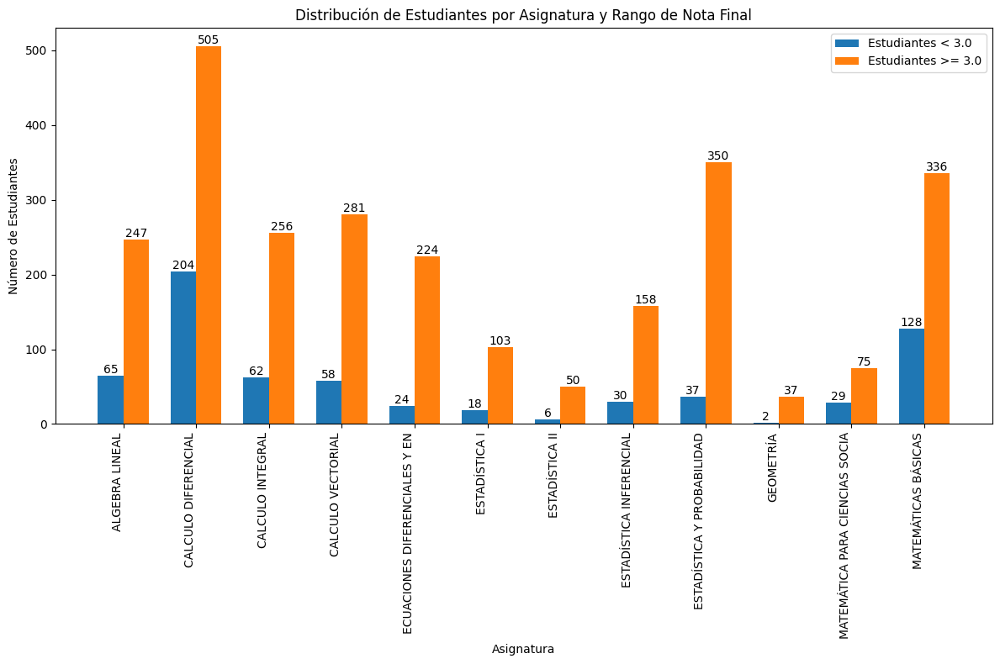

In [ ]:
# prompt: Construye Diagrama de Barras de Asignatura vs estudiantes_menor_3 vs estudiantes_mayor_3

# Prepare data for plotting
# Group by Asignatura and sum the counts of students
plot_data = datos3.groupby('Asignatura')[['estudiantes_menor_3', 'estudiantes_mayor_3']].sum().reset_index()

# Set the figure size
plt.figure(figsize=(12, 8))

# Create the bar chart
bar_width = 0.35
index = np.arange(len(plot_data['Asignatura']))

bar1 = plt.bar(index, plot_data['estudiantes_menor_3'], bar_width, label='Estudiantes < 3.0')
bar2 = plt.bar(index + bar_width, plot_data['estudiantes_mayor_3'], bar_width, label='Estudiantes >= 3.0')

# Add labels, title, and legend
plt.xlabel('Asignatura')
plt.ylabel('Número de Estudiantes')
plt.title('Distribución de Estudiantes por Asignatura y Rango de Nota Final')
plt.xticks(index + bar_width / 2, plot_data['Asignatura'], rotation=90, ha='right')
plt.legend()

# Add the values on top of the bars
def add_labels(bars):
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center')

add_labels(bar1)
add_labels(bar2)


# Adjust layout and display the plot
plt.tight_layout()
plt.show()

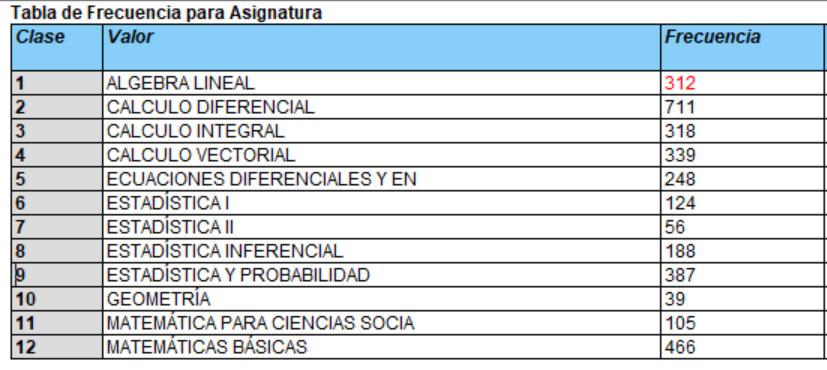

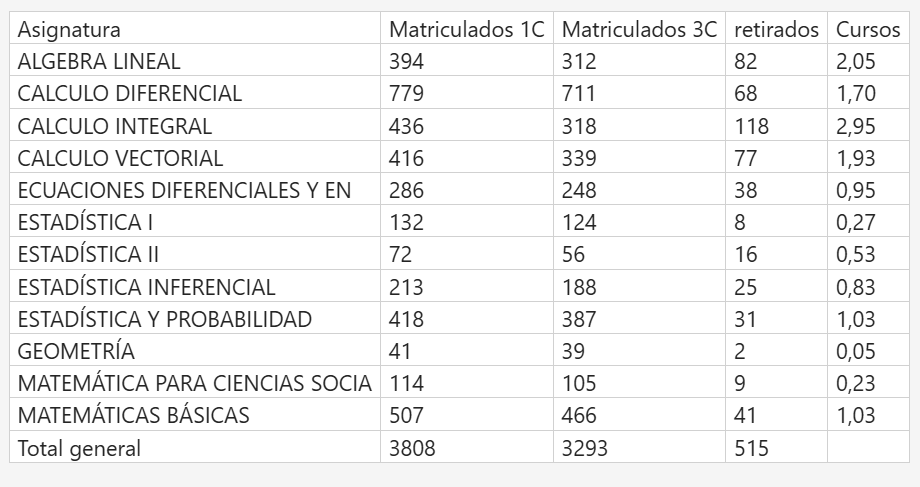

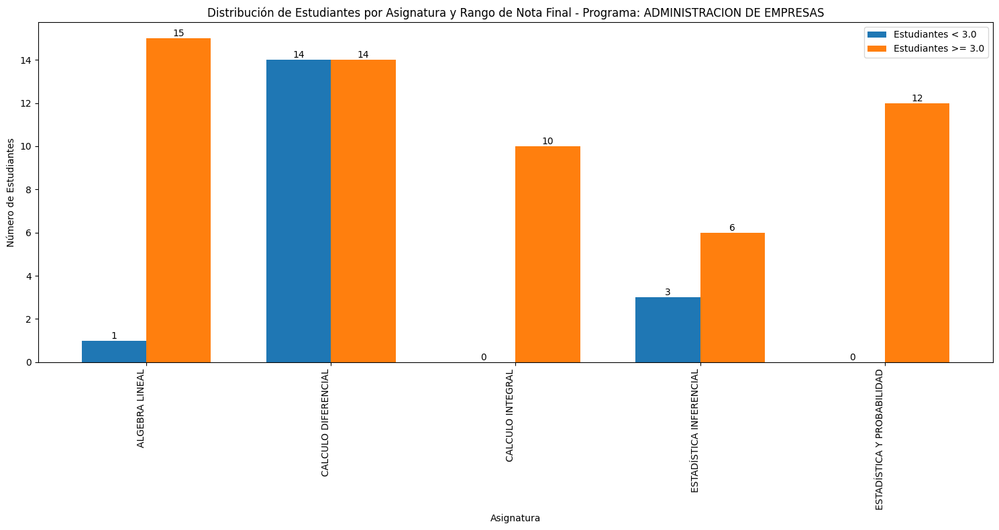

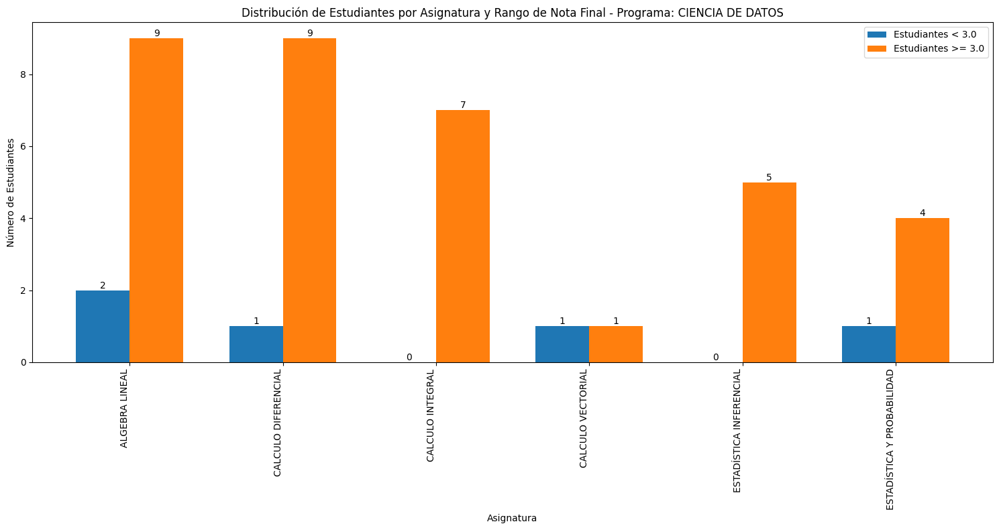

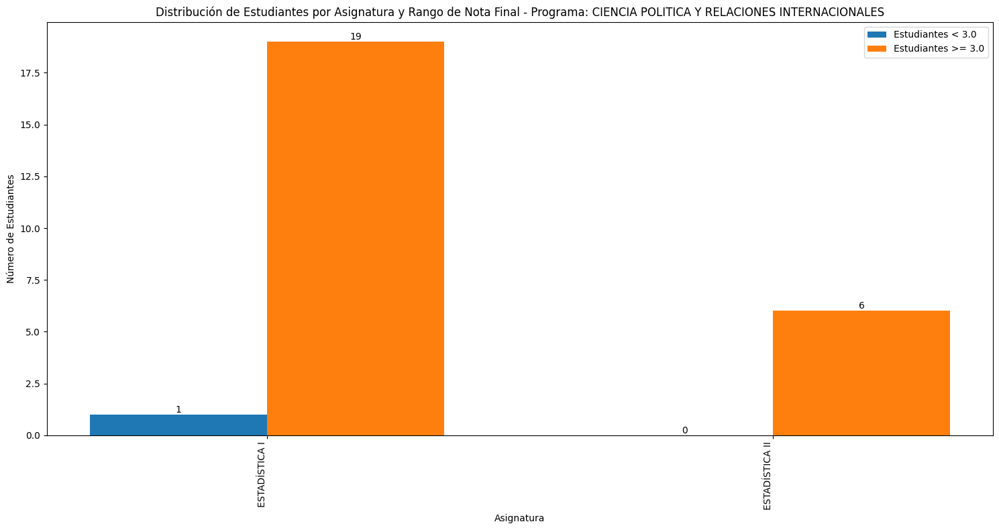

...

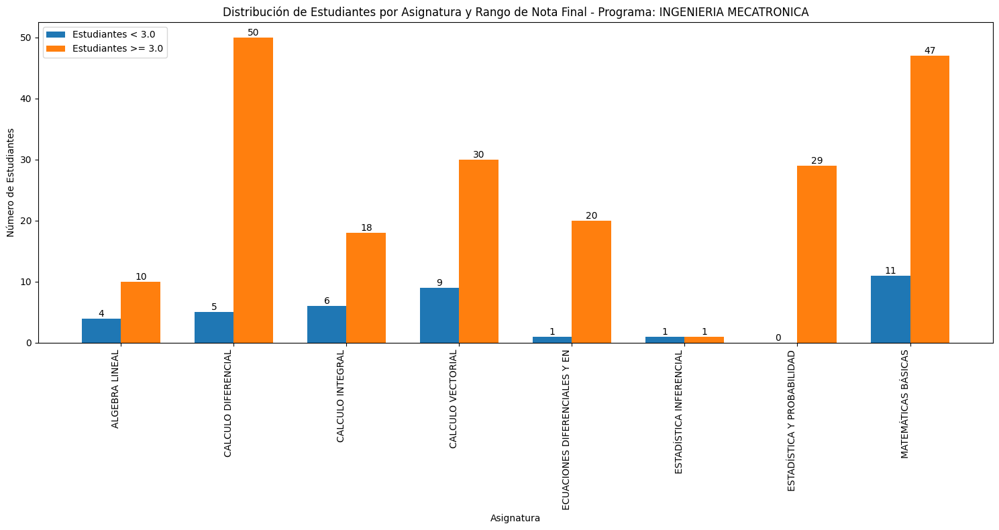

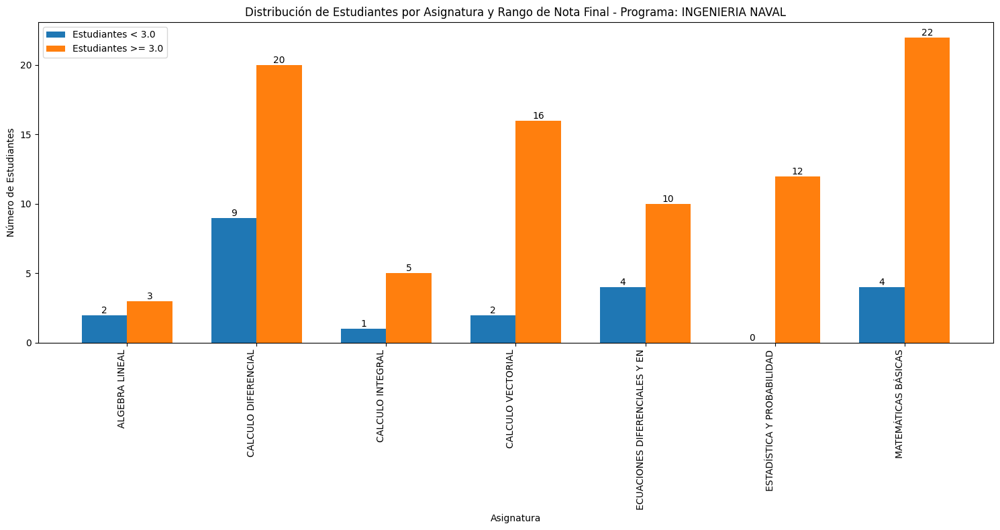

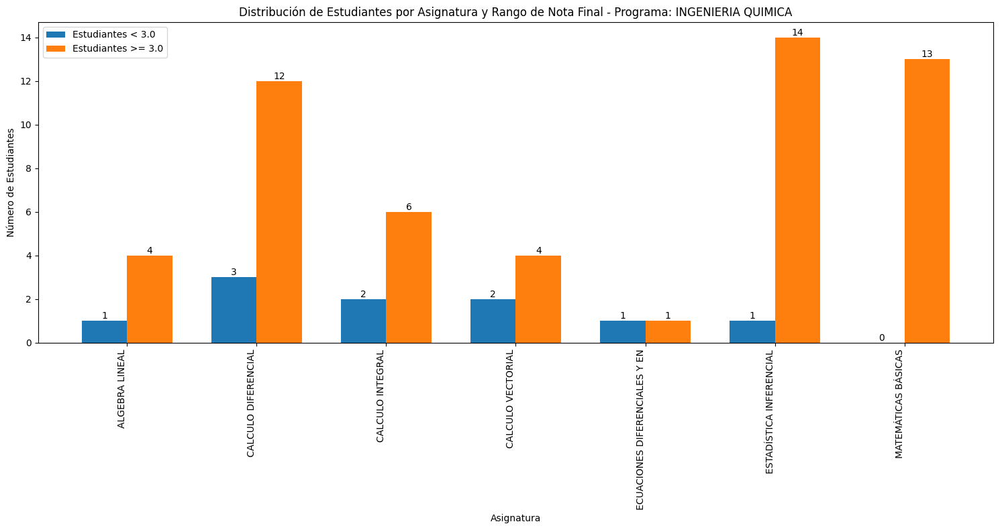

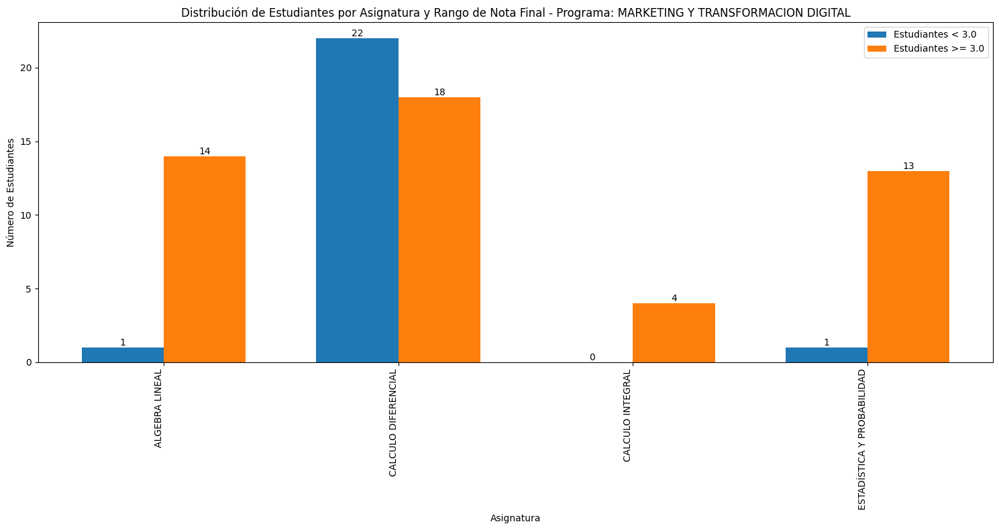

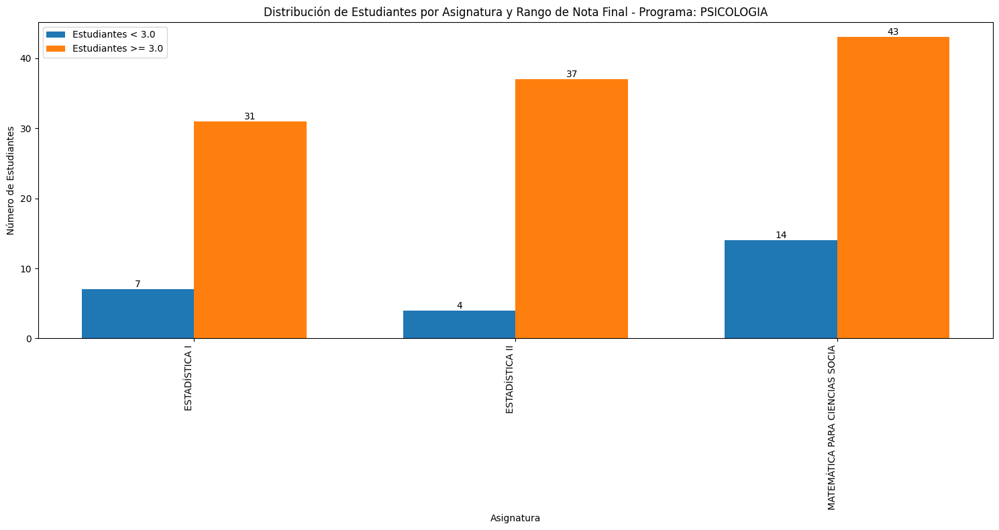

In [ ]:
# prompt: Agrega la variable Programa a # prompt: Construye Diagrama de Barras de Asignatura vs estudiantes_menor_3 vs estudiantes_mayor_3
# # Prepare data for plotting
# # Group by Asignatura and sum the counts of students
# plot_data = datos3.groupby('Asignatura')[['estudiantes_menor_3', 'estudiantes_mayor_3']].sum().reset_index()
# # Set the figure size
# plt.figure(figsize=(12, 8))
# # Create the bar chart
# bar_width = 0.35
# index = np.arange(len(plot_data['Asignatura']))
# bar1 = plt.bar(index, plot_data['estudiantes_menor_3'], bar_width, label='Estudiantes < 3.0')
# bar2 = plt.bar(index + bar_width, plot_data['estudiantes_mayor_3'], bar_width, label='Estudiantes >= 3.0')
# # Add labels, title, and legend
# plt.xlabel('Asignatura')
# plt.ylabel('Número de Estudiantes')
# plt.title('Distribución de Estudiantes por Asignatura y Rango de Nota Final')
# plt.xticks(index + bar_width / 2, plot_data['Asignatura'], rotation=90, ha='right')
# plt.legend()
# # Add the values on top of the bars
# def add_labels(bars):
#     for bar in bars:
#         yval = bar.get_height()
#         plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center')
# add_labels(bar1)
# add_labels(bar2)
# # Adjust layout and display the plot
# plt.tight_layout()
# plt.show()

# Prepare data for plotting
# Group by Programa and Asignatura and sum the counts of students
plot_data = datos3.groupby(['Programa', 'Asignatura'])[['estudiantes_menor_3', 'estudiantes_mayor_3']].sum().reset_index()

# Get unique programs
programas = plot_data['Programa'].unique()

# Iterate through each program and create a separate plot
for programa in programas:
    program_data = plot_data[plot_data['Programa'] == programa]

    # Set the figure size
    plt.figure(figsize=(15, 8))

    # Create the bar chart
    bar_width = 0.35
    index = np.arange(len(program_data['Asignatura']))

    bar1 = plt.bar(index, program_data['estudiantes_menor_3'], bar_width, label='Estudiantes < 3.0')
    bar2 = plt.bar(index + bar_width, program_data['estudiantes_mayor_3'], bar_width, label='Estudiantes >= 3.0')

    # Add labels, title, and legend
    plt.xlabel('Asignatura')
    plt.ylabel('Número de Estudiantes')
    plt.title(f'Distribución de Estudiantes por Asignatura y Rango de Nota Final - Programa: {programa}')
    plt.xticks(index + bar_width / 2, program_data['Asignatura'], rotation=90, ha='right')
    plt.legend()

    # Add the values on top of the bars
    def add_labels(bars):
        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center')

    add_labels(bar1)
    add_labels(bar2)

    # Adjust layout and display the plot
    plt.tight_layout()
    plt.show()


In [ ]:
# prompt: La informacion anterior la puedes convertir en una tabla de Excel

from google.colab import files
files.download(nombre_archivo_excel)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [1]:
import pandas as pd

data = {
    "ASIGNATURAS": [
        "ALGEBRA LINEAL",
        "CALCULO DIFERENCIAL",
        "CALCULO INTEGRAL",
        "CALCULO VECTORIAL",
        "ECUACIONES DIFERENCIALES Y EN",
        "ESTADISTICA I",
        "ESTADISTICA II",
        "ESTADÍSTICA INFERENCIAL",
        "ESTADÍSTICA Y PROBABILIDAD",
        "GEOMETRÍA",
        "MATEMÁTICAS PARA CIENCIAS SOCIALES",
        "MATEMÁTICAS BÁSICAS"
    ],
    "MATRICULADOS": [394, 779, 436, 416, 286, 132, 72, 213, 418, 41, 114, 507],
    "RETIRADOS": [82, 68, 118, 77, 38, 8, 16, 25, 31, 2, 9, 41],
    "PERDIERON": [65, 204, 62, 58, 24, 18, 6, 30, 37, 2, 29, 128],
    "GANARON": [247, 505, 256, 281, 224, 103, 50, 158, 350, 37, 75, 336]
}

df = pd.DataFrame(data)
df

,ASIGNATURAS,MATRICULADOS,RETIRADOS,PERDIERON,GANARON
0,ALGEBRA LINEAL,394,82,65,247
1,CALCULO DIFERENCIAL,779,68,204,505
2,CALCULO INTEGRAL,436,118,62,256
3,CALCULO VECTORIAL,416,77,58,281
4,ECUACIONES DIFERENCIALES Y EN,286,38,24,224
5,ESTADISTICA I,132,8,18,103
6,ESTADISTICA II,72,16,6,50
7,ESTADÍSTICA INFERENCIAL,213,25,30,158
8,ESTADÍSTICA Y PROBABILIDAD,418,31,37,350
9,GEOMETRÍA,41,2,2,37


<Figure size 1200x800 with 0 Axes>

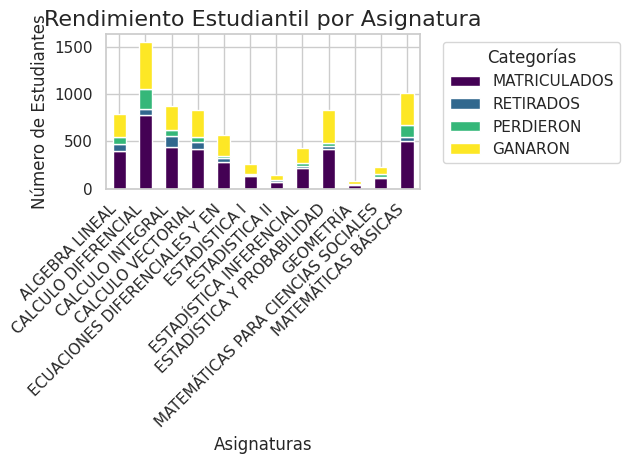

In [3]:
# Configurar estilo
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))

# Gráfico de barras apiladas (opcional)
df.set_index('ASIGNATURAS').plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Rendimiento Estudiantil por Asignatura', fontsize=16)
plt.xlabel('Asignaturas', fontsize=12)
plt.ylabel('Número de Estudiantes', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Categorías', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

plt.show()

<Figure size 1200x800 with 0 Axes>

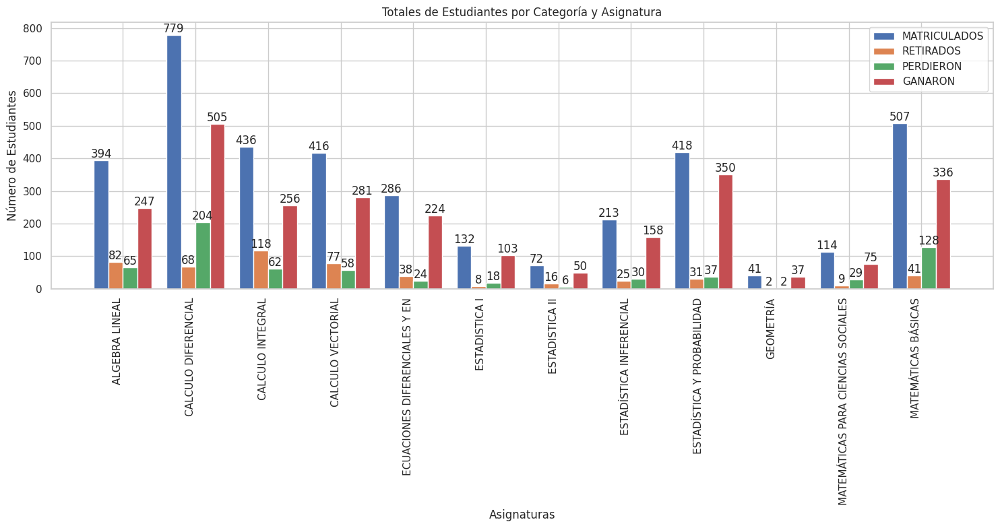

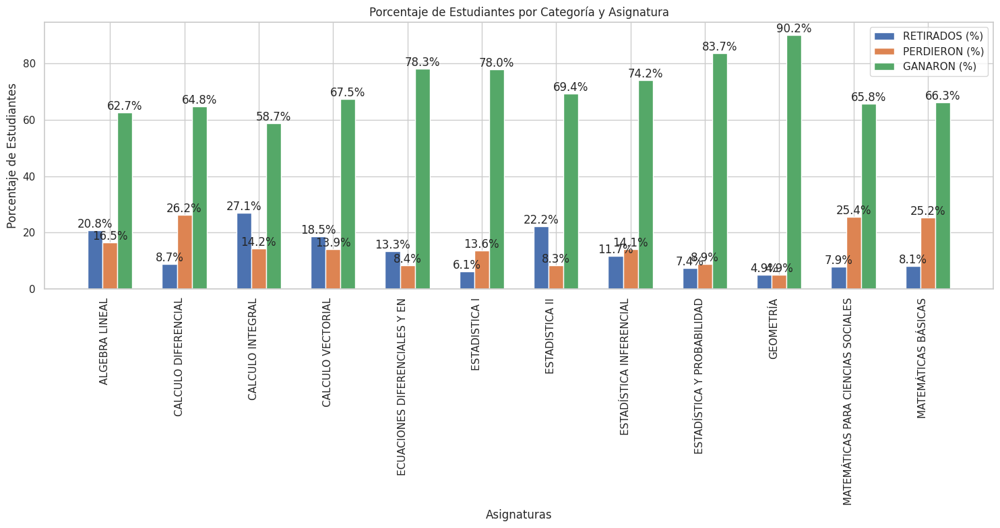

In [6]:
# prompt: En el mismo grafico una barra para MATRICULADOS,	RETIRADOS,	PERDIERON, GANARON donde aparezcan los totales y otra grafica donde aparezacn los porcentajes
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))

# Gráfico de barras con totales
plt.figure(figsize=(15, 8))

bar_width = 0.2
index = np.arange(len(df['ASIGNATURAS']))

bar1 = plt.bar(index - bar_width*1.5, df['MATRICULADOS'], bar_width, label='MATRICULADOS')
bar2 = plt.bar(index - bar_width/2, df['RETIRADOS'], bar_width, label='RETIRADOS')
bar3 = plt.bar(index + bar_width/2, df['PERDIERON'], bar_width, label='PERDIERON')
bar4 = plt.bar(index + bar_width*1.5, df['GANARON'], bar_width, label='GANARON')

plt.xlabel('Asignaturas')
plt.ylabel('Número de Estudiantes')
plt.title('Totales de Estudiantes por Categoría y Asignatura')
plt.xticks(index, df['ASIGNATURAS'], rotation=90, ha='right')
plt.legend()

def add_labels(bars):
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center')

add_labels(bar1)
add_labels(bar2)
add_labels(bar3)
add_labels(bar4)

plt.tight_layout()
plt.show()

# Calcular porcentajes
df_percentages = df.copy()
df_percentages[['RETIRADOS', 'PERDIERON', 'GANARON']] = df[['RETIRADOS', 'PERDIERON', 'GANARON']].div(df['MATRICULADOS'], axis=0) * 100

# Gráfico de barras con porcentajes
plt.figure(figsize=(15, 8))

bar1 = plt.bar(index - bar_width, df_percentages['RETIRADOS'], bar_width, label='RETIRADOS (%)')
bar2 = plt.bar(index, df_percentages['PERDIERON'], bar_width, label='PERDIERON (%)')
bar3 = plt.bar(index + bar_width, df_percentages['GANARON'], bar_width, label='GANARON (%)')

plt.xlabel('Asignaturas')
plt.ylabel('Porcentaje de Estudiantes')
plt.title('Porcentaje de Estudiantes por Categoría y Asignatura')
plt.xticks(index, df_percentages['ASIGNATURAS'], rotation=90, ha='right')
plt.legend()

def add_percentage_labels(bars):
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.1f}%', va='bottom', ha='center')

add_percentage_labels(bar1)
add_percentage_labels(bar2)
add_percentage_labels(bar3)


plt.tight_layout()
plt.show()
